# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

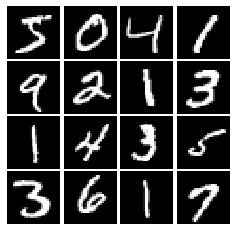

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary（任意的） shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    return tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    uni_initializer = tf.random_uniform_initializer(minval=-1, maxval=1)
    noise = uni_initializer((batch_size, dim))
    return noise

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [14]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#         pass
        tf.keras.layers.Dense(input_shape=(784,), units=256, use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(input_shape=(256,), units=256, use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(input_shape=(256,), units=1, use_bias=True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [15]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [16]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#         pass
        tf.keras.layers.Dense(input_shape=(noise_dim,), units=1024, use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(units=1024, use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(units=784, use_bias=True, activation='tanh'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [17]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [8]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    D_labels = tf.ones_like(logits_real)
    G_fake_labels = tf.zeros_like(logits_fake)
#     bce = tf.keras.losses.BinaryCrossentropy()
#     loss_1 = bce(y_true=D_labels, y_pred=logits_real)
#     loss_2 = bce(y_true=G_fake_labels, y_pred=logits_fake)
    loss_1 = tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_real, labels=D_labels)
    loss_2 = tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=G_fake_labels)
    loss_1 = tf.reduce_mean(loss_1)
    loss_2 = tf.reduce_mean(loss_2)
    loss = loss_1 + loss_2

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    G_real_labels = tf.ones_like(logits_fake)
#     bce = tf.keras.losses.BinaryCrossentropy()
#     loss = bce(y_true=G_real_labels, y_pred=tf.math.log(logits_fake))
    loss = tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=G_real_labels)
    loss = tf.reduce_mean(loss)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [9]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [10]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [11]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [12]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.079, G:0.7524


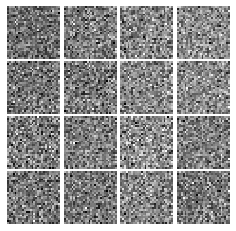

Epoch: 0, Iter: 20, D: 0.6211, G:0.8722


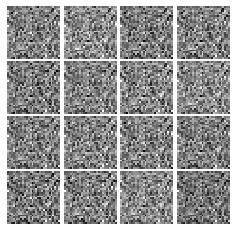

Epoch: 0, Iter: 40, D: 0.4077, G:1.239


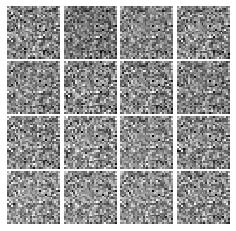

Epoch: 0, Iter: 60, D: 0.6922, G:4.835


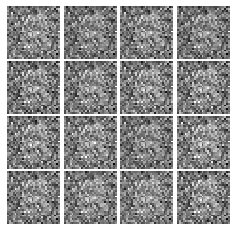

Epoch: 0, Iter: 80, D: 1.448, G:1.145


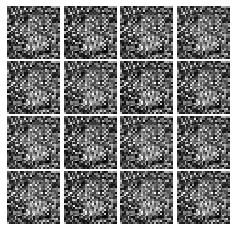

Epoch: 0, Iter: 100, D: 1.378, G:0.8466


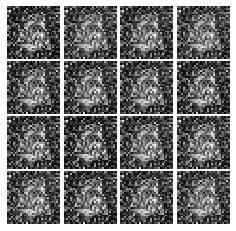

Epoch: 0, Iter: 120, D: 1.454, G:1.026


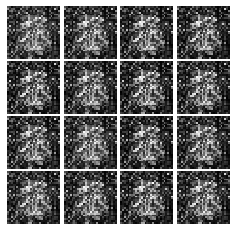

Epoch: 0, Iter: 140, D: 1.207, G:1.096


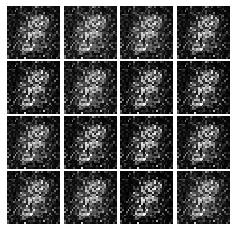

Epoch: 0, Iter: 160, D: 1.422, G:0.989


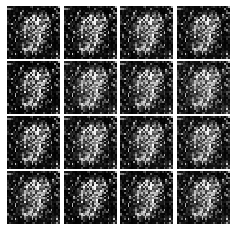

Epoch: 0, Iter: 180, D: 1.588, G:1.34


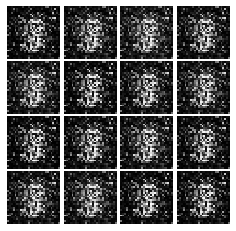

Epoch: 0, Iter: 200, D: 1.176, G:1.658


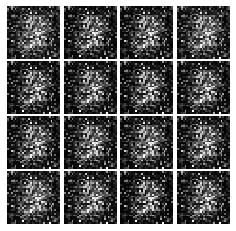

Epoch: 0, Iter: 220, D: 1.973, G:1.879


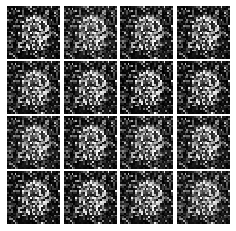

Epoch: 0, Iter: 240, D: 1.407, G:1.002


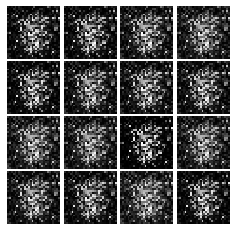

Epoch: 0, Iter: 260, D: 1.266, G:1.129


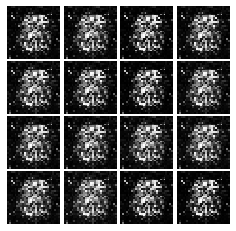

Epoch: 0, Iter: 280, D: 1.652, G:0.7362


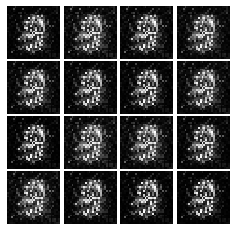

Epoch: 0, Iter: 300, D: 1.701, G:2.33


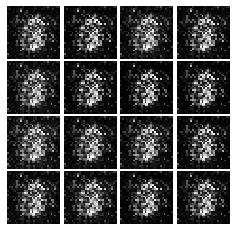

Epoch: 0, Iter: 320, D: 1.666, G:1.51


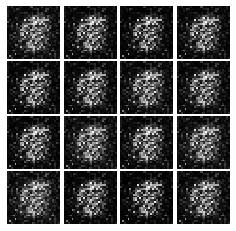

Epoch: 0, Iter: 340, D: 0.8311, G:1.47


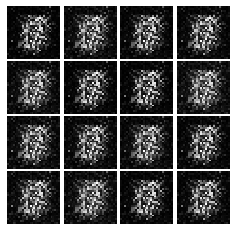

Epoch: 0, Iter: 360, D: 1.873, G:0.7347


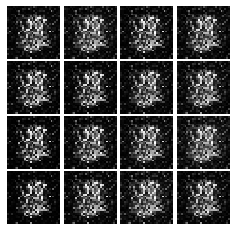

Epoch: 0, Iter: 380, D: 0.844, G:1.256


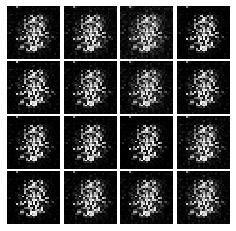

Epoch: 0, Iter: 400, D: 1.369, G:1.126


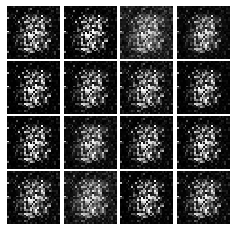

Epoch: 0, Iter: 420, D: 1.669, G:1.648


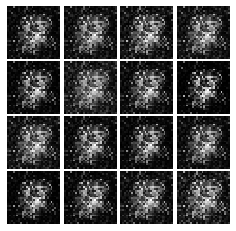

Epoch: 0, Iter: 440, D: 1.143, G:2.156


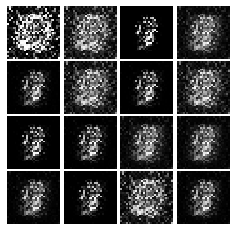

Epoch: 0, Iter: 460, D: 1.162, G:0.9589


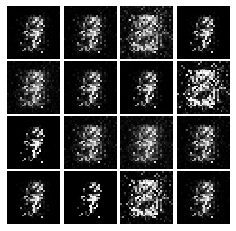

Epoch: 1, Iter: 480, D: 1.481, G:0.8703


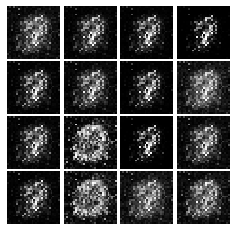

Epoch: 1, Iter: 500, D: 1.203, G:0.9776


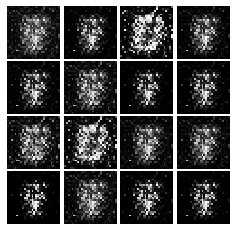

Epoch: 1, Iter: 520, D: 1.17, G:1.078


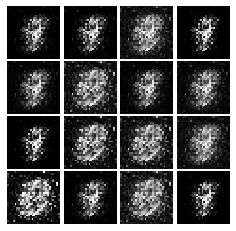

Epoch: 1, Iter: 540, D: 1.451, G:0.9774


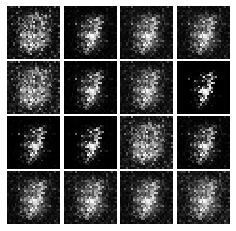

Epoch: 1, Iter: 560, D: 0.9471, G:1.398


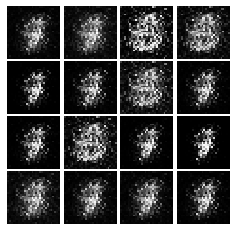

Epoch: 1, Iter: 580, D: 0.8876, G:2.556


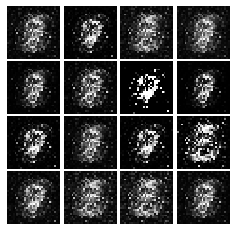

Epoch: 1, Iter: 600, D: 3.026, G:0.06425


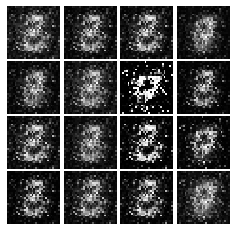

Epoch: 1, Iter: 620, D: 1.181, G:1.238


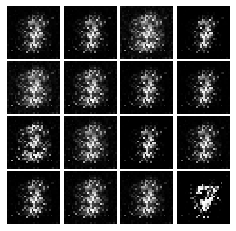

Epoch: 1, Iter: 640, D: 1.214, G:1.373


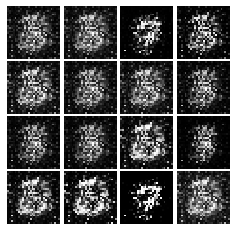

Epoch: 1, Iter: 660, D: 1.108, G:1.553


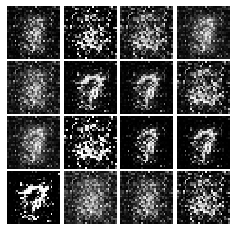

Epoch: 1, Iter: 680, D: 1.649, G:0.5359


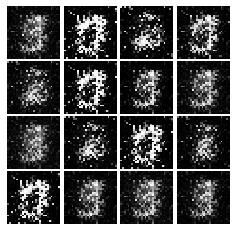

Epoch: 1, Iter: 700, D: 1.453, G:1.196


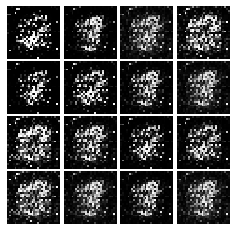

Epoch: 1, Iter: 720, D: 1.218, G:1.006


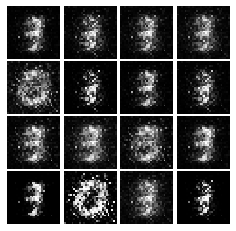

Epoch: 1, Iter: 740, D: 1.178, G:1.361


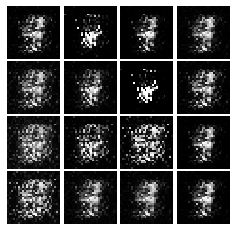

Epoch: 1, Iter: 760, D: 1.076, G:1.581


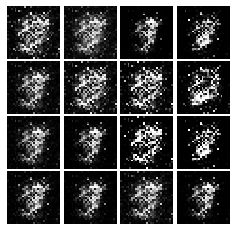

Epoch: 1, Iter: 780, D: 1.12, G:1.374


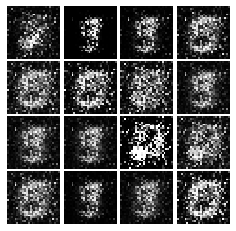

Epoch: 1, Iter: 800, D: 1.619, G:1.258


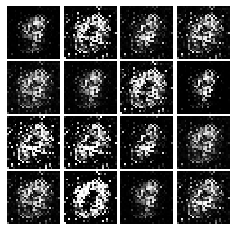

Epoch: 1, Iter: 820, D: 1.132, G:0.9802


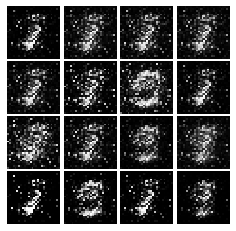

Epoch: 1, Iter: 840, D: 1.267, G:1.102


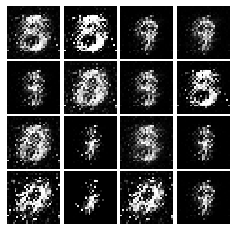

Epoch: 1, Iter: 860, D: 1.098, G:1.143


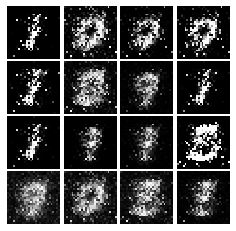

Epoch: 1, Iter: 880, D: 1.301, G:0.8417


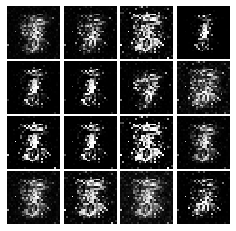

Epoch: 1, Iter: 900, D: 1.217, G:2.415


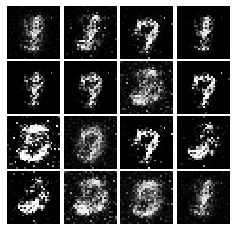

Epoch: 1, Iter: 920, D: 1.529, G:1.894


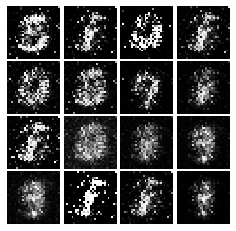

Epoch: 2, Iter: 940, D: 1.365, G:0.8917


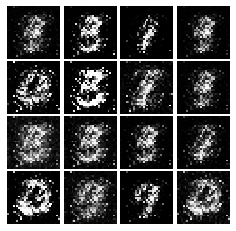

Epoch: 2, Iter: 960, D: 1.138, G:1.078


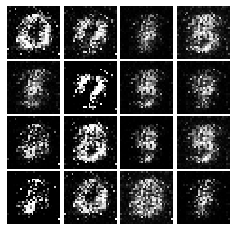

Epoch: 2, Iter: 980, D: 1.234, G:1.205


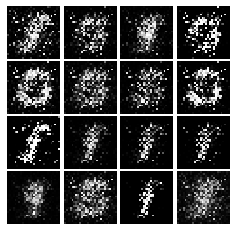

Epoch: 2, Iter: 1000, D: 1.516, G:0.9842


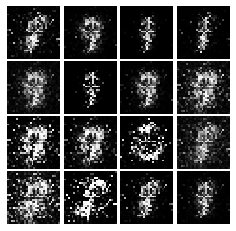

Epoch: 2, Iter: 1020, D: 1.32, G:0.47


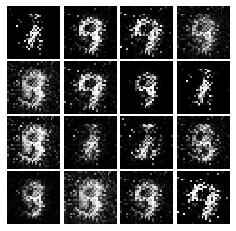

Epoch: 2, Iter: 1040, D: 1.266, G:0.906


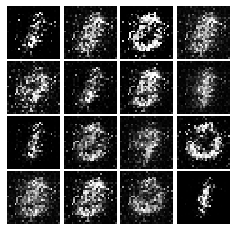

Epoch: 2, Iter: 1060, D: 1.297, G:1.078


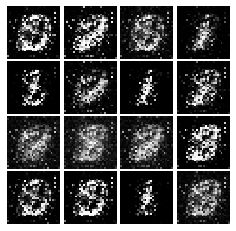

Epoch: 2, Iter: 1080, D: 1.395, G:0.8402


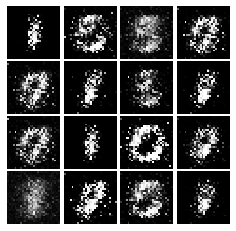

Epoch: 2, Iter: 1100, D: 1.172, G:0.9699


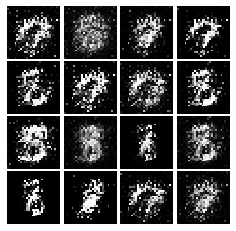

Epoch: 2, Iter: 1120, D: 1.356, G:1.025


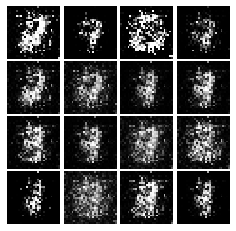

Epoch: 2, Iter: 1140, D: 0.9983, G:1.638


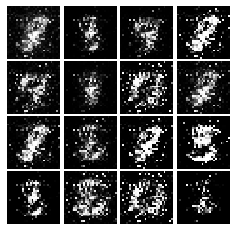

Epoch: 2, Iter: 1160, D: 1.0, G:1.566


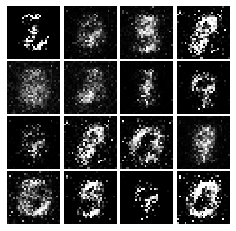

Epoch: 2, Iter: 1180, D: 1.598, G:0.3845


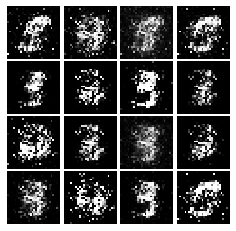

Epoch: 2, Iter: 1200, D: 1.293, G:0.8559


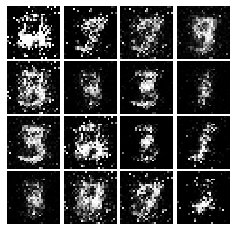

Epoch: 2, Iter: 1220, D: 1.339, G:1.22


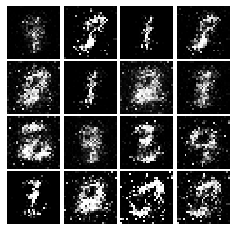

Epoch: 2, Iter: 1240, D: 1.194, G:0.706


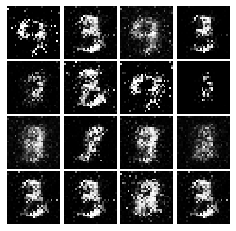

Epoch: 2, Iter: 1260, D: 1.041, G:1.263


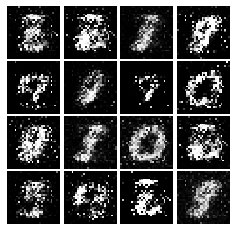

Epoch: 2, Iter: 1280, D: 1.397, G:0.8578


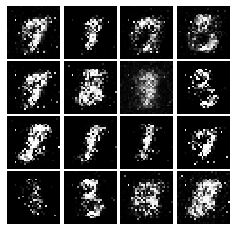

Epoch: 2, Iter: 1300, D: 1.117, G:0.9857


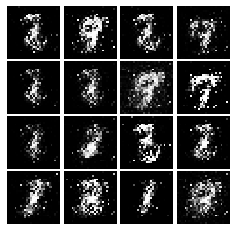

Epoch: 2, Iter: 1320, D: 1.443, G:1.018


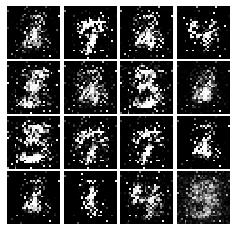

Epoch: 2, Iter: 1340, D: 1.109, G:1.002


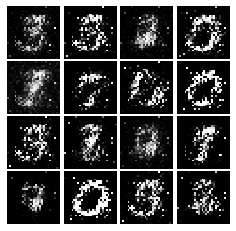

Epoch: 2, Iter: 1360, D: 1.234, G:1.127


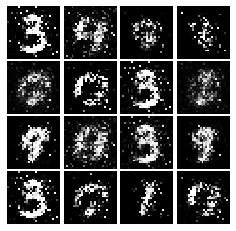

Epoch: 2, Iter: 1380, D: 1.216, G:1.662


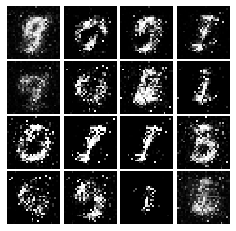

Epoch: 2, Iter: 1400, D: 1.231, G:0.7485


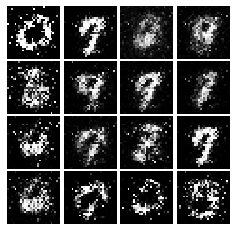

Epoch: 3, Iter: 1420, D: 1.468, G:0.866


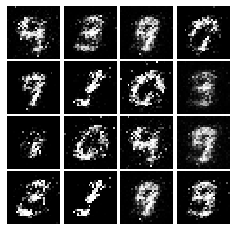

Epoch: 3, Iter: 1440, D: 1.168, G:0.9528


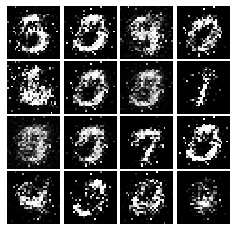

Epoch: 3, Iter: 1460, D: 1.187, G:1.286


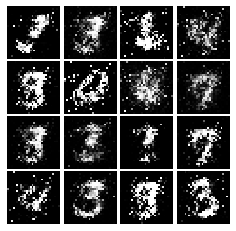

Epoch: 3, Iter: 1480, D: 1.359, G:1.086


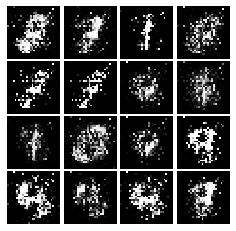

Epoch: 3, Iter: 1500, D: 1.182, G:1.029


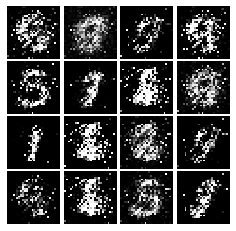

Epoch: 3, Iter: 1520, D: 1.411, G:1.039


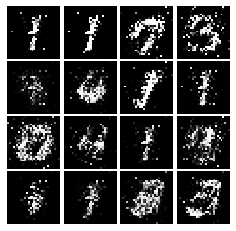

Epoch: 3, Iter: 1540, D: 1.362, G:0.9729


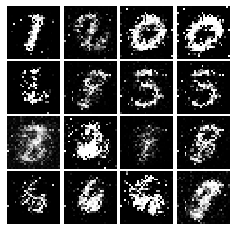

Epoch: 3, Iter: 1560, D: 1.168, G:1.187


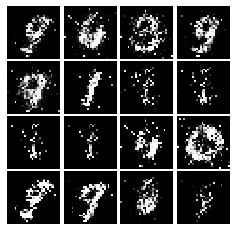

Epoch: 3, Iter: 1580, D: 1.133, G:1.122


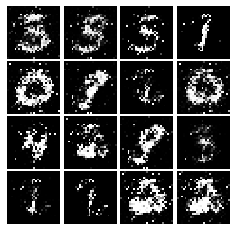

Epoch: 3, Iter: 1600, D: 1.432, G:0.6935


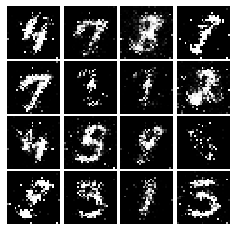

Epoch: 3, Iter: 1620, D: 1.071, G:1.126


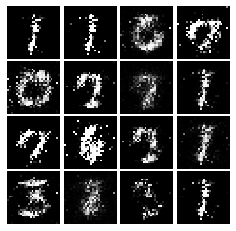

Epoch: 3, Iter: 1640, D: 1.163, G:0.9929


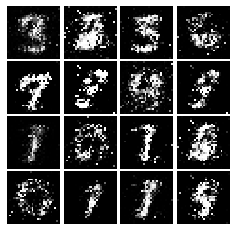

Epoch: 3, Iter: 1660, D: 1.058, G:1.097


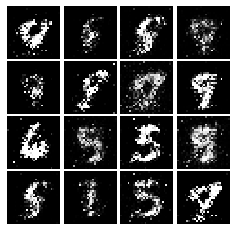

Epoch: 3, Iter: 1680, D: 1.221, G:0.9268


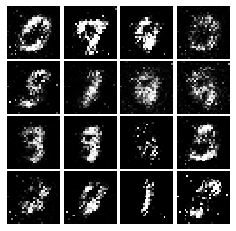

Epoch: 3, Iter: 1700, D: 1.208, G:0.941


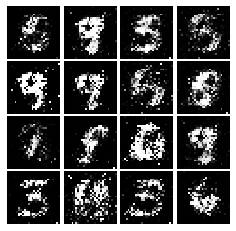

Epoch: 3, Iter: 1720, D: 1.206, G:0.988


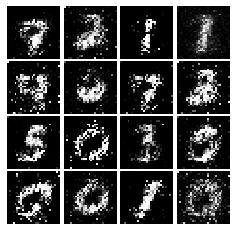

Epoch: 3, Iter: 1740, D: 1.244, G:0.9781


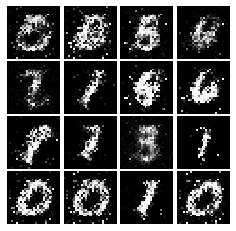

Epoch: 3, Iter: 1760, D: 1.044, G:1.102


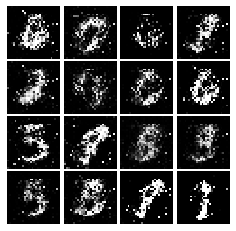

Epoch: 3, Iter: 1780, D: 1.148, G:1.138


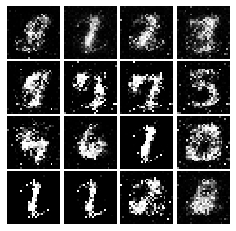

Epoch: 3, Iter: 1800, D: 1.381, G:0.9446


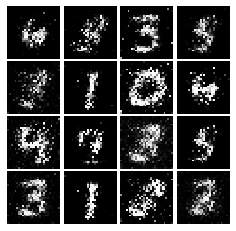

Epoch: 3, Iter: 1820, D: 1.264, G:1.25


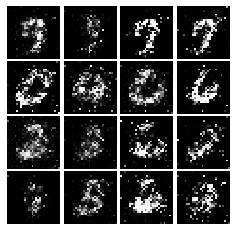

Epoch: 3, Iter: 1840, D: 1.316, G:0.9723


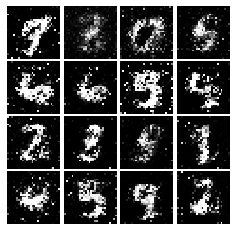

Epoch: 3, Iter: 1860, D: 1.2, G:0.5411


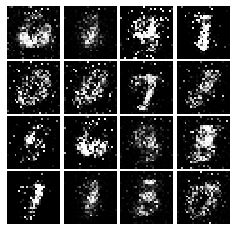

Epoch: 4, Iter: 1880, D: 1.174, G:0.9207


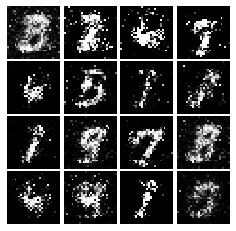

Epoch: 4, Iter: 1900, D: 1.192, G:1.067


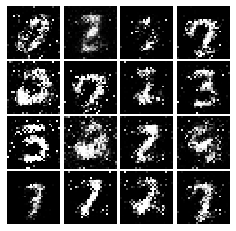

Epoch: 4, Iter: 1920, D: 1.35, G:1.02


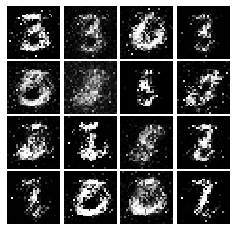

Epoch: 4, Iter: 1940, D: 1.229, G:0.8228


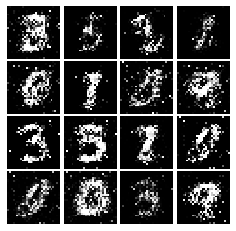

Epoch: 4, Iter: 1960, D: 1.387, G:0.8624


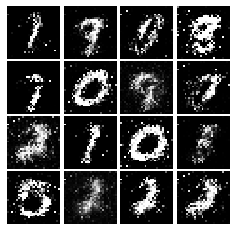

Epoch: 4, Iter: 1980, D: 1.218, G:0.8923


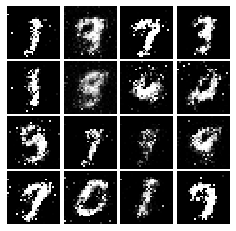

Epoch: 4, Iter: 2000, D: 1.296, G:0.9227


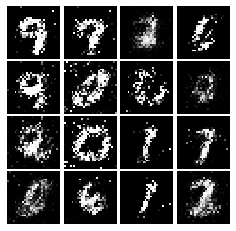

Epoch: 4, Iter: 2020, D: 1.231, G:0.8603


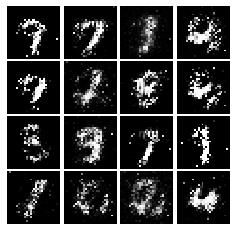

Epoch: 4, Iter: 2040, D: 1.276, G:0.8335


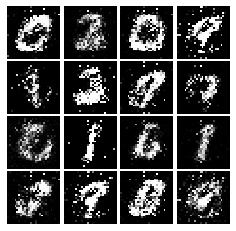

Epoch: 4, Iter: 2060, D: 1.419, G:0.806


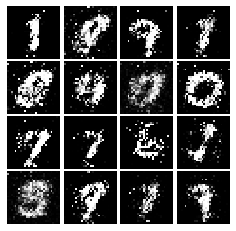

Epoch: 4, Iter: 2080, D: 1.276, G:0.9706


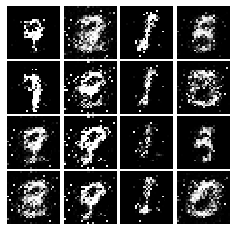

Epoch: 4, Iter: 2100, D: 1.601, G:0.6348


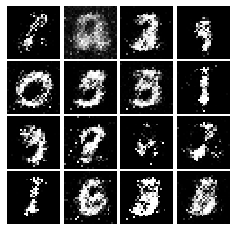

Epoch: 4, Iter: 2120, D: 1.387, G:0.7865


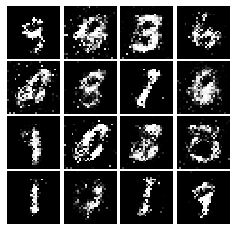

Epoch: 4, Iter: 2140, D: 1.386, G:0.8832


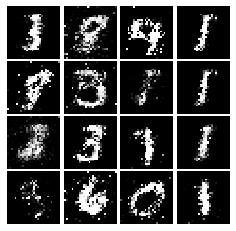

Epoch: 4, Iter: 2160, D: 1.302, G:0.8443


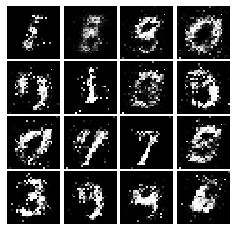

Epoch: 4, Iter: 2180, D: 1.223, G:0.9621


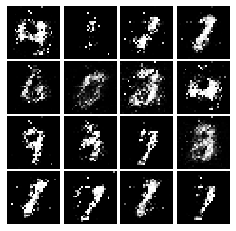

Epoch: 4, Iter: 2200, D: 1.381, G:0.8251


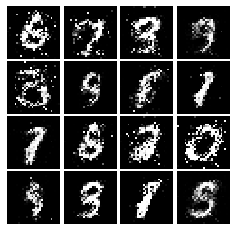

Epoch: 4, Iter: 2220, D: 1.364, G:1.159


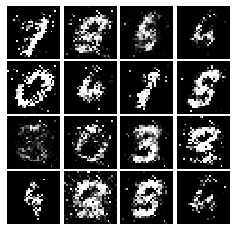

Epoch: 4, Iter: 2240, D: 1.286, G:0.9037


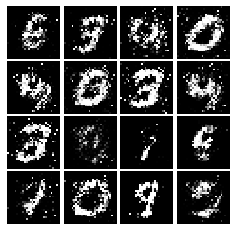

Epoch: 4, Iter: 2260, D: 1.309, G:0.9095


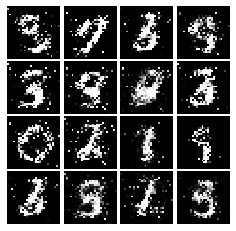

Epoch: 4, Iter: 2280, D: 1.242, G:1.032


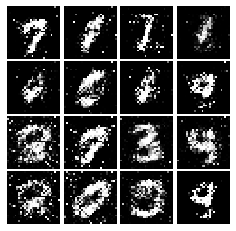

Epoch: 4, Iter: 2300, D: 1.243, G:0.8113


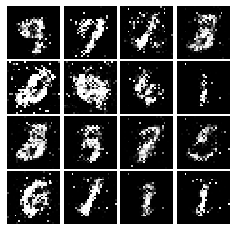

Epoch: 4, Iter: 2320, D: 1.23, G:0.8728


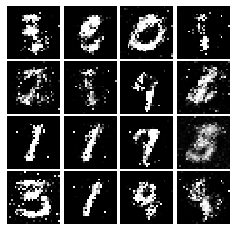

Epoch: 4, Iter: 2340, D: 1.504, G:0.9077


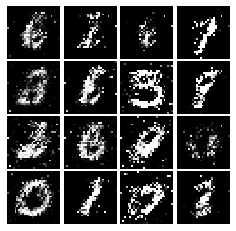

Epoch: 5, Iter: 2360, D: 1.223, G:1.713


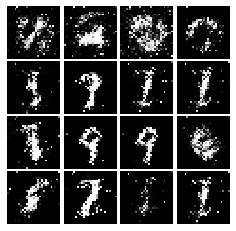

Epoch: 5, Iter: 2380, D: 1.297, G:0.9133


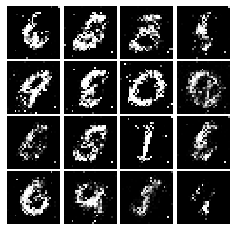

Epoch: 5, Iter: 2400, D: 1.32, G:0.7747


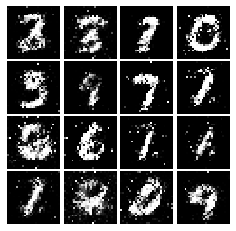

Epoch: 5, Iter: 2420, D: 1.27, G:0.8754


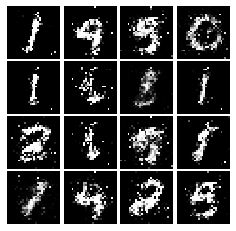

Epoch: 5, Iter: 2440, D: 1.345, G:0.3871


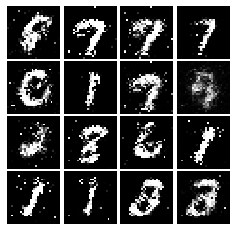

Epoch: 5, Iter: 2460, D: 1.248, G:0.8824


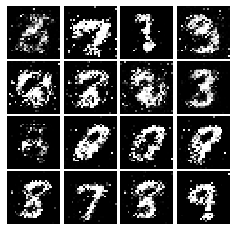

Epoch: 5, Iter: 2480, D: 1.295, G:0.8092


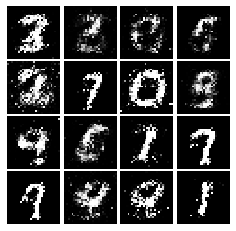

Epoch: 5, Iter: 2500, D: 1.256, G:0.8329


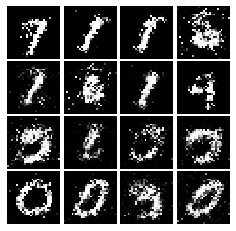

Epoch: 5, Iter: 2520, D: 1.371, G:0.9042


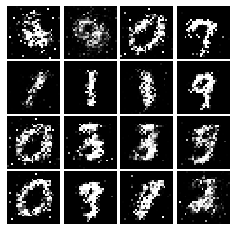

Epoch: 5, Iter: 2540, D: 1.307, G:0.791


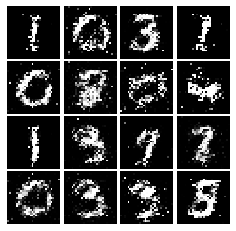

Epoch: 5, Iter: 2560, D: 1.288, G:0.8553


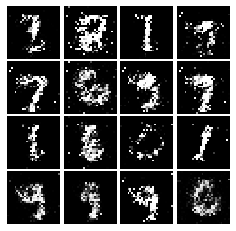

Epoch: 5, Iter: 2580, D: 1.193, G:0.7674


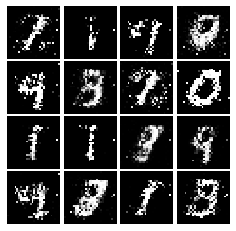

Epoch: 5, Iter: 2600, D: 1.529, G:0.7322


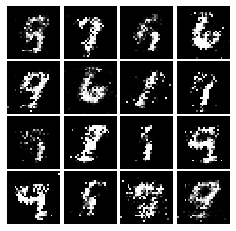

Epoch: 5, Iter: 2620, D: 1.321, G:0.7854


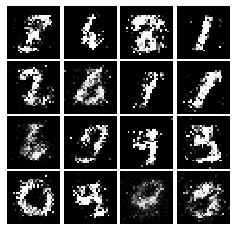

Epoch: 5, Iter: 2640, D: 1.278, G:1.138


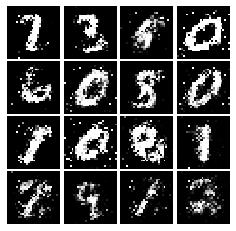

Epoch: 5, Iter: 2660, D: 1.305, G:1.062


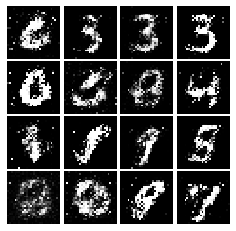

Epoch: 5, Iter: 2680, D: 1.427, G:0.8756


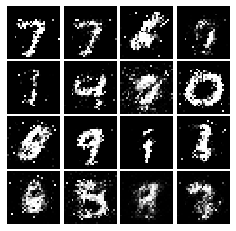

Epoch: 5, Iter: 2700, D: 1.589, G:0.6874


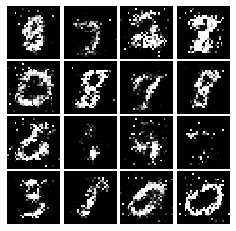

Epoch: 5, Iter: 2720, D: 1.309, G:0.8389


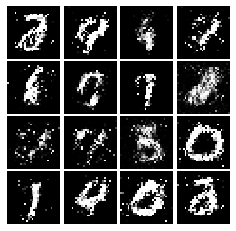

Epoch: 5, Iter: 2740, D: 1.27, G:0.8748


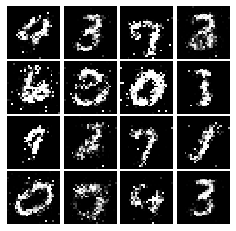

Epoch: 5, Iter: 2760, D: 1.425, G:0.7787


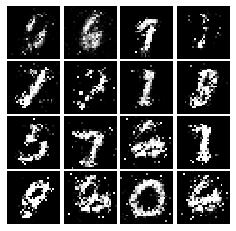

Epoch: 5, Iter: 2780, D: 1.3, G:0.8052


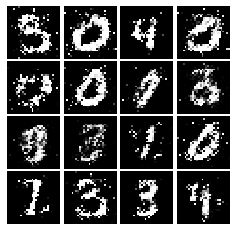

Epoch: 5, Iter: 2800, D: 1.359, G:0.9331


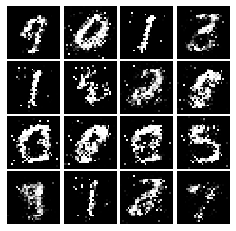

Epoch: 6, Iter: 2820, D: 1.323, G:0.7103


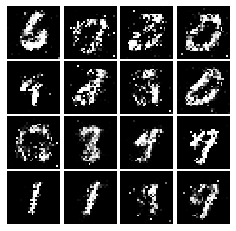

Epoch: 6, Iter: 2840, D: 1.269, G:0.8691


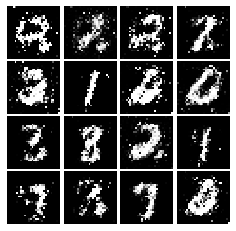

Epoch: 6, Iter: 2860, D: 1.314, G:0.8659


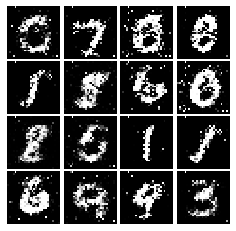

Epoch: 6, Iter: 2880, D: 1.286, G:0.8207


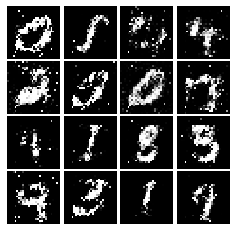

Epoch: 6, Iter: 2900, D: 1.248, G:0.8576


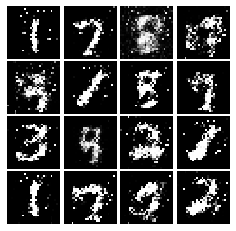

Epoch: 6, Iter: 2920, D: 1.353, G:0.8835


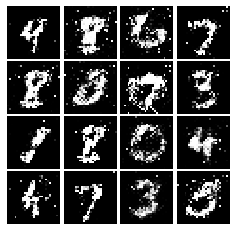

Epoch: 6, Iter: 2940, D: 1.398, G:0.8184


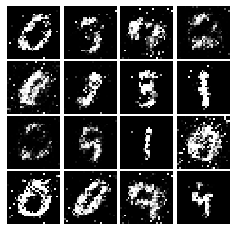

Epoch: 6, Iter: 2960, D: 1.337, G:0.8554


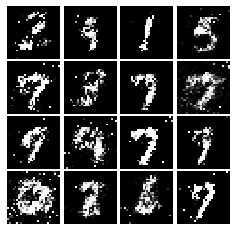

Epoch: 6, Iter: 2980, D: 1.351, G:0.8281


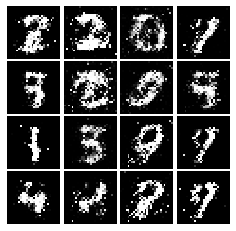

Epoch: 6, Iter: 3000, D: 1.31, G:1.099


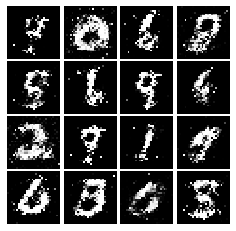

Epoch: 6, Iter: 3020, D: 1.404, G:0.8523


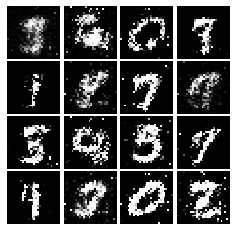

Epoch: 6, Iter: 3040, D: 1.373, G:0.8155


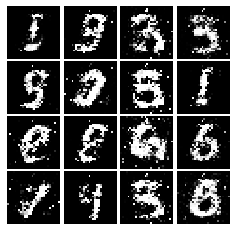

Epoch: 6, Iter: 3060, D: 1.353, G:0.7764


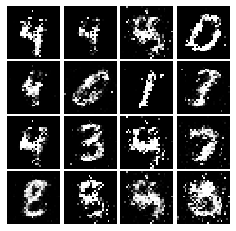

Epoch: 6, Iter: 3080, D: 1.357, G:0.7893


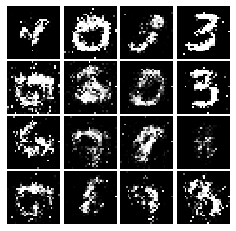

Epoch: 6, Iter: 3100, D: 1.383, G:0.768


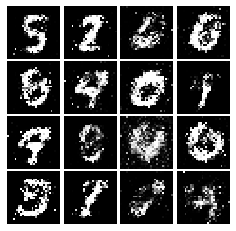

Epoch: 6, Iter: 3120, D: 1.397, G:0.7957


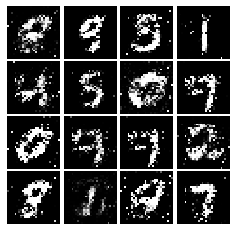

Epoch: 6, Iter: 3140, D: 1.365, G:0.7211


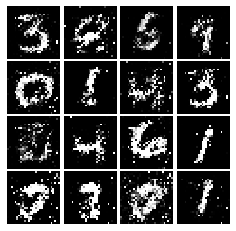

Epoch: 6, Iter: 3160, D: 1.275, G:0.7991


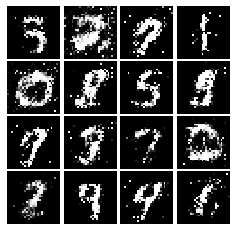

Epoch: 6, Iter: 3180, D: 1.274, G:0.7583


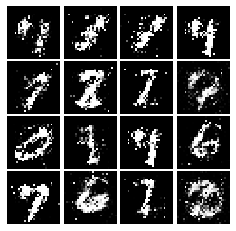

Epoch: 6, Iter: 3200, D: 1.344, G:0.8933


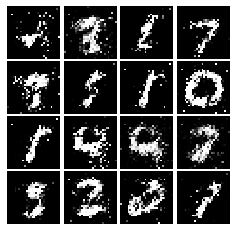

Epoch: 6, Iter: 3220, D: 1.328, G:0.8635


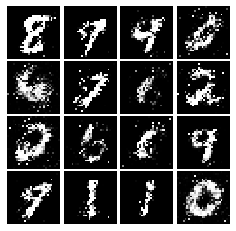

Epoch: 6, Iter: 3240, D: 1.291, G:0.7778


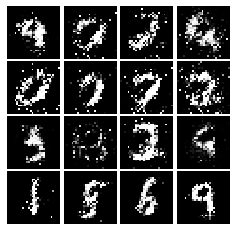

Epoch: 6, Iter: 3260, D: 1.415, G:0.7103


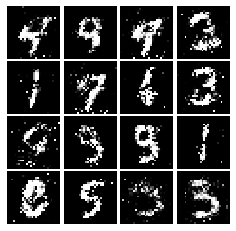

Epoch: 6, Iter: 3280, D: 1.389, G:0.7444


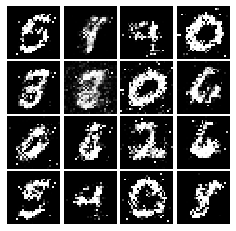

Epoch: 7, Iter: 3300, D: 1.326, G:0.816


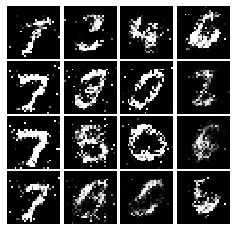

Epoch: 7, Iter: 3320, D: 1.308, G:0.8243


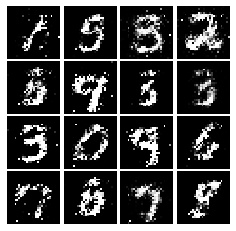

Epoch: 7, Iter: 3340, D: 1.249, G:0.7947


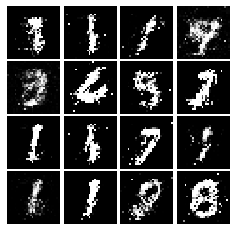

Epoch: 7, Iter: 3360, D: 1.36, G:0.822


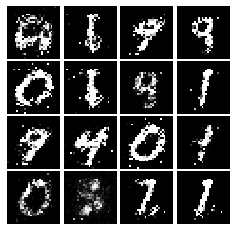

Epoch: 7, Iter: 3380, D: 1.301, G:0.8223


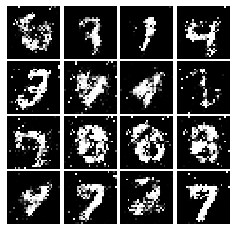

Epoch: 7, Iter: 3400, D: 1.367, G:0.7504


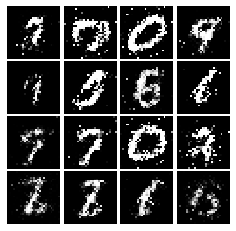

Epoch: 7, Iter: 3420, D: 1.316, G:0.8516


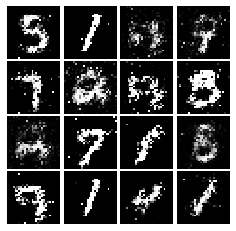

Epoch: 7, Iter: 3440, D: 1.331, G:0.8456


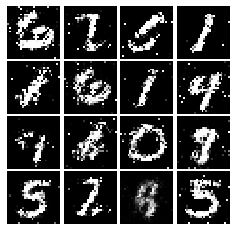

Epoch: 7, Iter: 3460, D: 1.264, G:0.8938


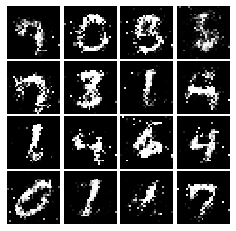

Epoch: 7, Iter: 3480, D: 1.229, G:0.8408


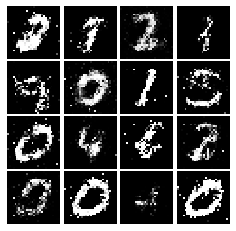

Epoch: 7, Iter: 3500, D: 1.301, G:0.8202


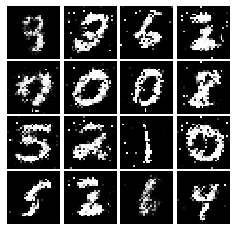

Epoch: 7, Iter: 3520, D: 1.343, G:0.8459


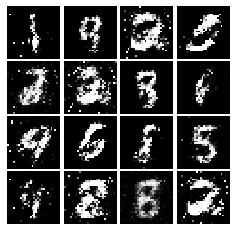

Epoch: 7, Iter: 3540, D: 1.264, G:0.8003


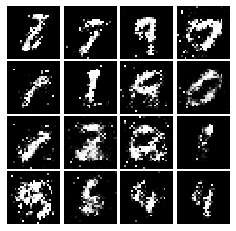

Epoch: 7, Iter: 3560, D: 1.246, G:0.8871


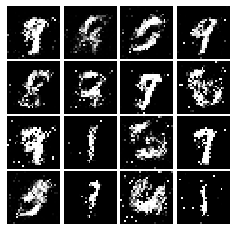

Epoch: 7, Iter: 3580, D: 1.293, G:0.8353


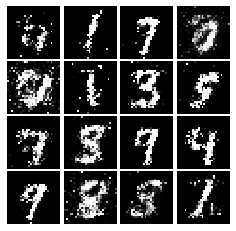

Epoch: 7, Iter: 3600, D: 1.387, G:0.731


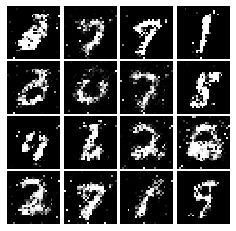

Epoch: 7, Iter: 3620, D: 1.289, G:0.7991


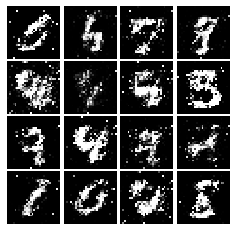

Epoch: 7, Iter: 3640, D: 1.307, G:0.8201


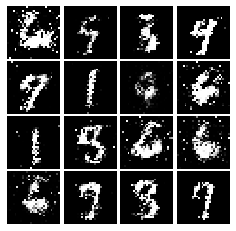

Epoch: 7, Iter: 3660, D: 1.314, G:0.8427


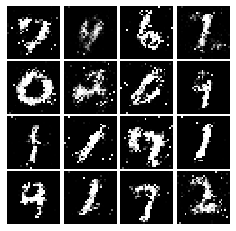

Epoch: 7, Iter: 3680, D: 1.355, G:0.8153


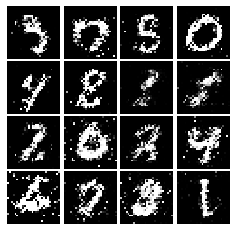

Epoch: 7, Iter: 3700, D: 1.329, G:0.8039


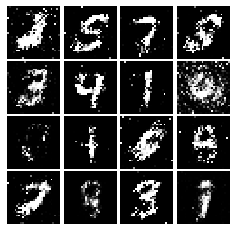

Epoch: 7, Iter: 3720, D: 1.351, G:0.8401


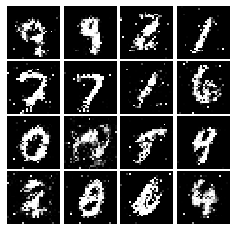

Epoch: 7, Iter: 3740, D: 1.298, G:0.8146


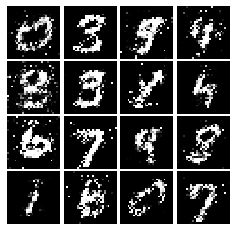

Epoch: 8, Iter: 3760, D: 1.351, G:0.8576


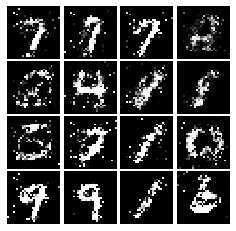

Epoch: 8, Iter: 3780, D: 1.346, G:0.7551


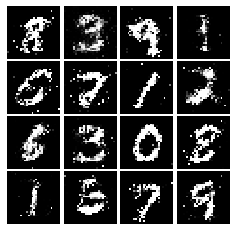

Epoch: 8, Iter: 3800, D: 1.304, G:0.8179


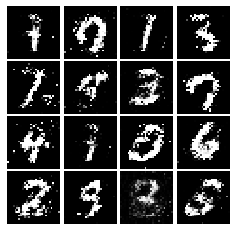

Epoch: 8, Iter: 3820, D: 1.35, G:0.7245


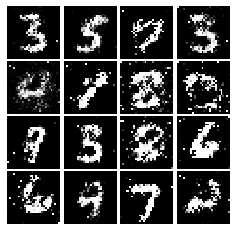

Epoch: 8, Iter: 3840, D: 1.377, G:0.7888


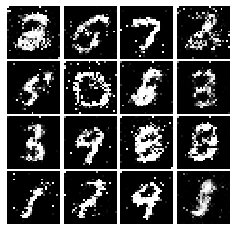

Epoch: 8, Iter: 3860, D: 1.106, G:0.9425


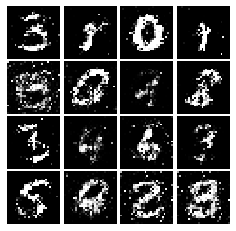

Epoch: 8, Iter: 3880, D: 1.249, G:0.8564


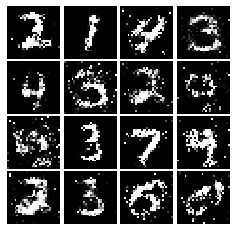

Epoch: 8, Iter: 3900, D: 1.339, G:0.8549


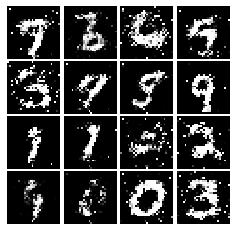

Epoch: 8, Iter: 3920, D: 1.271, G:0.7697


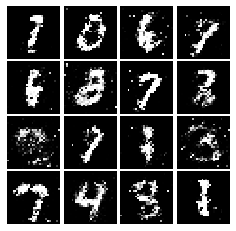

Epoch: 8, Iter: 3940, D: 1.291, G:0.7872


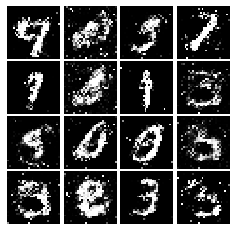

Epoch: 8, Iter: 3960, D: 1.348, G:0.7771


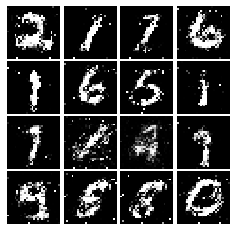

Epoch: 8, Iter: 3980, D: 1.3, G:0.8754


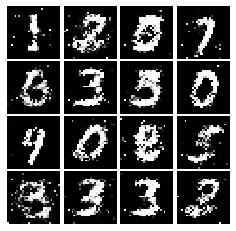

Epoch: 8, Iter: 4000, D: 1.368, G:0.8117


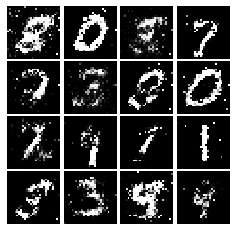

Epoch: 8, Iter: 4020, D: 1.369, G:0.7587


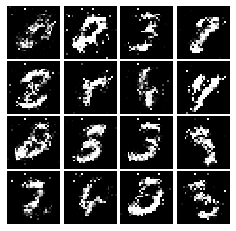

Epoch: 8, Iter: 4040, D: 1.336, G:0.8178


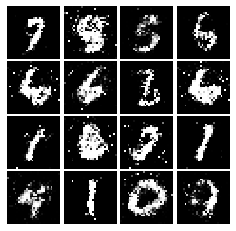

Epoch: 8, Iter: 4060, D: 1.279, G:0.818


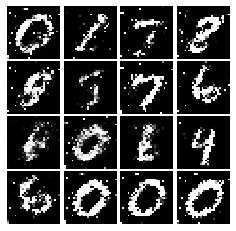

Epoch: 8, Iter: 4080, D: 1.394, G:0.7797


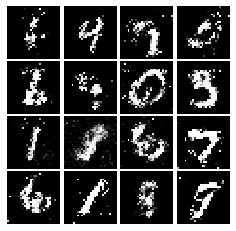

Epoch: 8, Iter: 4100, D: 1.418, G:0.7384


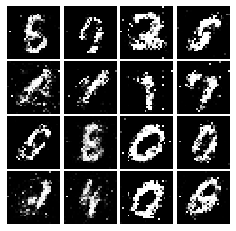

Epoch: 8, Iter: 4120, D: 1.334, G:0.7849


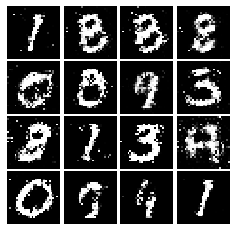

Epoch: 8, Iter: 4140, D: 1.355, G:0.7908


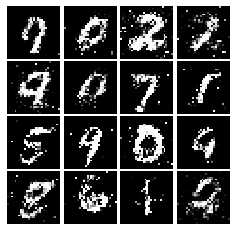

Epoch: 8, Iter: 4160, D: 1.322, G:0.825


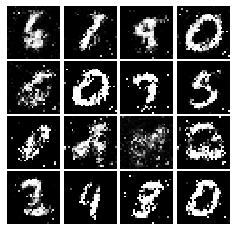

Epoch: 8, Iter: 4180, D: 1.374, G:0.7786


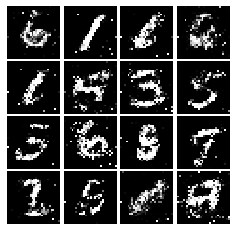

Epoch: 8, Iter: 4200, D: 1.283, G:0.7903


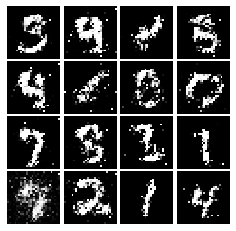

Epoch: 8, Iter: 4220, D: 1.375, G:0.7593


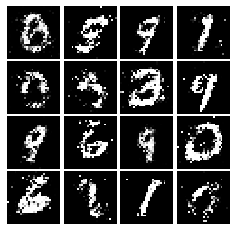

Epoch: 9, Iter: 4240, D: 1.374, G:0.8001


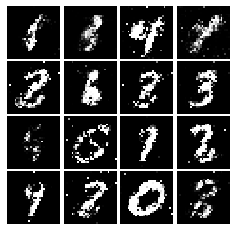

Epoch: 9, Iter: 4260, D: 1.49, G:0.674


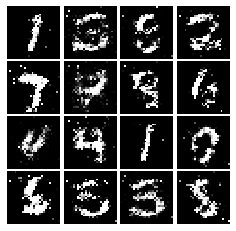

Epoch: 9, Iter: 4280, D: 1.371, G:0.8756


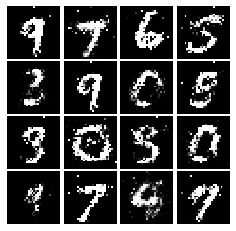

Epoch: 9, Iter: 4300, D: 1.339, G:0.8075


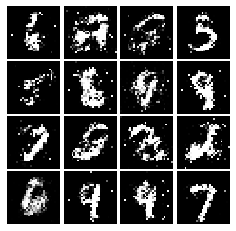

Epoch: 9, Iter: 4320, D: 1.339, G:0.7625


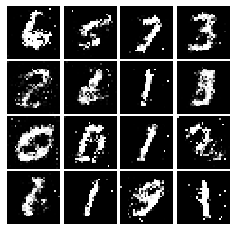

Epoch: 9, Iter: 4340, D: 1.357, G:0.8158


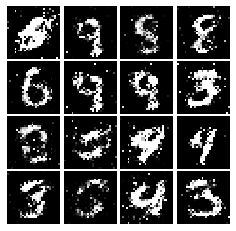

Epoch: 9, Iter: 4360, D: 1.395, G:0.7214


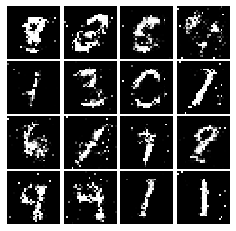

Epoch: 9, Iter: 4380, D: 1.396, G:0.7459


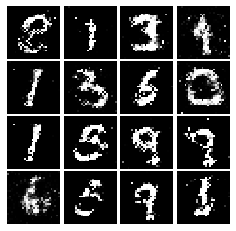

Epoch: 9, Iter: 4400, D: 1.288, G:0.8278


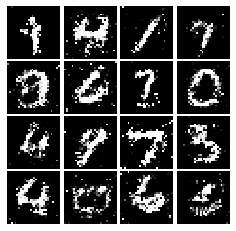

Epoch: 9, Iter: 4420, D: 1.354, G:0.8236


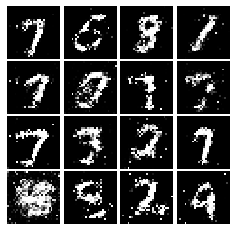

Epoch: 9, Iter: 4440, D: 1.311, G:0.7818


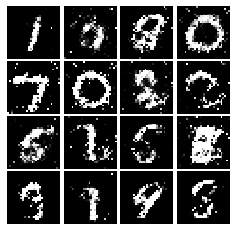

Epoch: 9, Iter: 4460, D: 1.462, G:0.7158


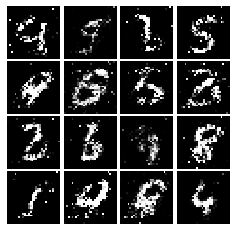

Epoch: 9, Iter: 4480, D: 1.35, G:0.7726


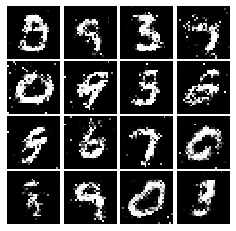

Epoch: 9, Iter: 4500, D: 1.368, G:0.7644


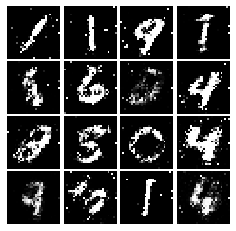

Epoch: 9, Iter: 4520, D: 1.248, G:0.7276


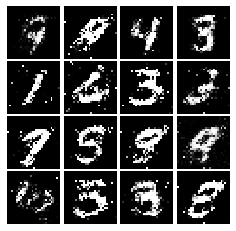

Epoch: 9, Iter: 4540, D: 1.44, G:0.8178


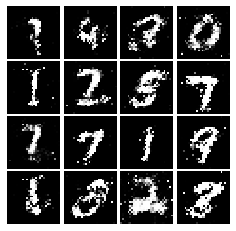

Epoch: 9, Iter: 4560, D: 1.325, G:0.7199


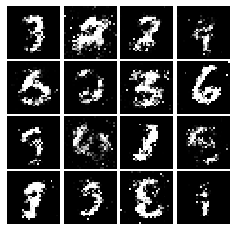

Epoch: 9, Iter: 4580, D: 1.318, G:0.768


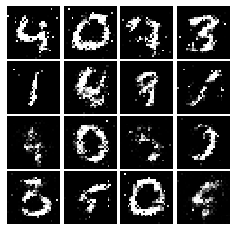

Epoch: 9, Iter: 4600, D: 1.416, G:0.7875


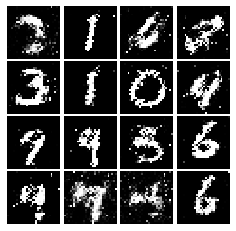

Epoch: 9, Iter: 4620, D: 1.33, G:0.8197


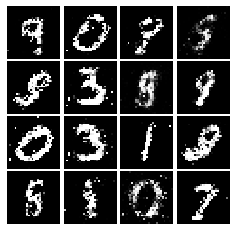

Epoch: 9, Iter: 4640, D: 1.315, G:0.7645


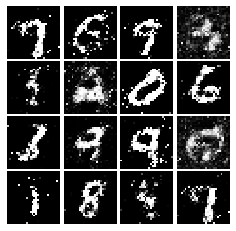

Epoch: 9, Iter: 4660, D: 1.362, G:0.8788


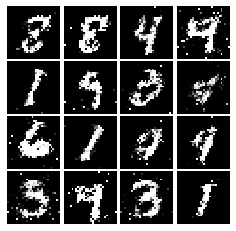

Epoch: 9, Iter: 4680, D: 1.352, G:0.8986


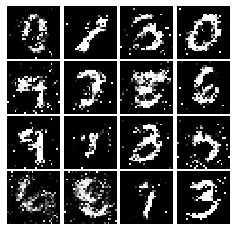

Final images


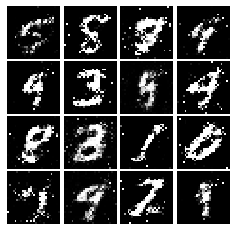

In [58]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [59]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    loss_1 = tf.reduce_mean(tf.square(scores_real - 1)) / 2
    loss_2 = tf.reduce_mean(tf.square(scores_fake)) / 2
    loss = loss_1 + loss_2

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    loss = tf.reduce_mean(tf.square(scores_fake - 1)) / 2

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [60]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.9222, G:0.3939


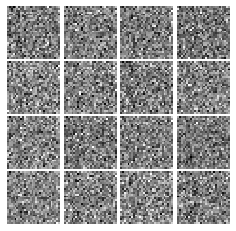

Epoch: 0, Iter: 20, D: 0.01935, G:0.9351


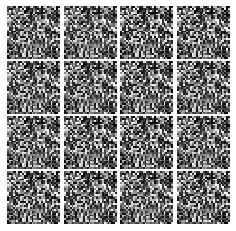

Epoch: 0, Iter: 40, D: 0.02892, G:0.7928


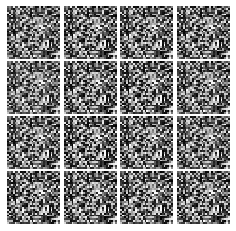

Epoch: 0, Iter: 60, D: 0.1738, G:0.7897


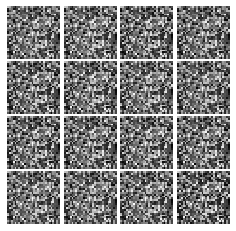

Epoch: 0, Iter: 80, D: 0.02649, G:0.9672


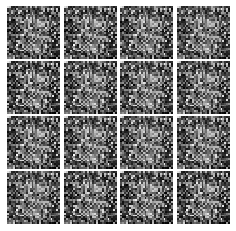

Epoch: 0, Iter: 100, D: 0.1166, G:0.5767


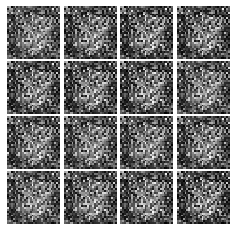

Epoch: 0, Iter: 120, D: 0.3712, G:2.099


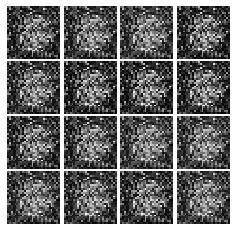

Epoch: 0, Iter: 140, D: 0.08389, G:0.5551


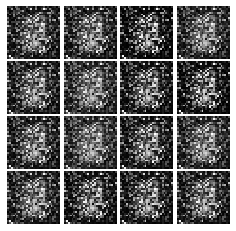

Epoch: 0, Iter: 160, D: 0.1477, G:0.3242


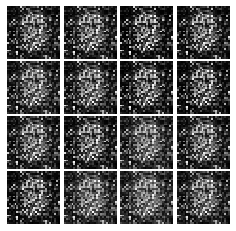

Epoch: 0, Iter: 180, D: 0.1238, G:0.4227


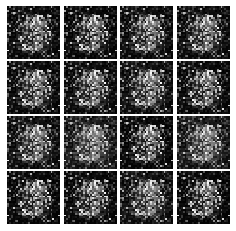

Epoch: 0, Iter: 200, D: 0.06027, G:0.6086


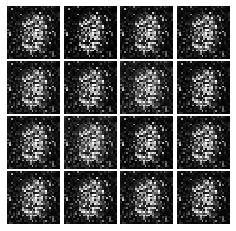

Epoch: 0, Iter: 220, D: 0.325, G:0.6222


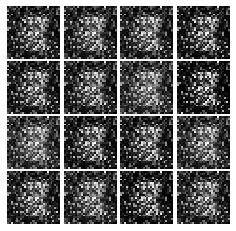

Epoch: 0, Iter: 240, D: 0.6689, G:0.1837


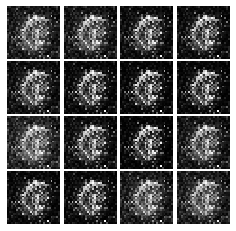

Epoch: 0, Iter: 260, D: 0.122, G:0.5325


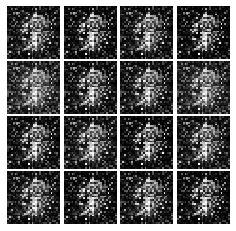

Epoch: 0, Iter: 280, D: 0.1441, G:0.3258


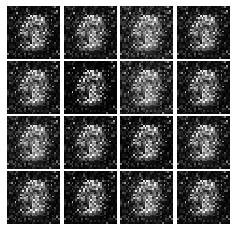

Epoch: 0, Iter: 300, D: 0.08385, G:0.4024


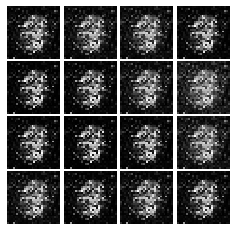

Epoch: 0, Iter: 320, D: 0.2096, G:0.6145


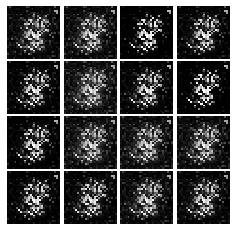

Epoch: 0, Iter: 340, D: 0.153, G:0.1896


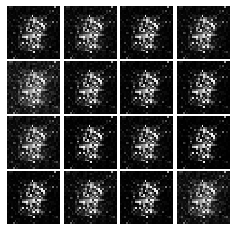

Epoch: 0, Iter: 360, D: 0.07122, G:0.5581


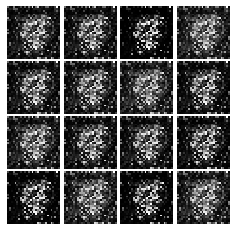

Epoch: 0, Iter: 380, D: 0.1188, G:0.3318


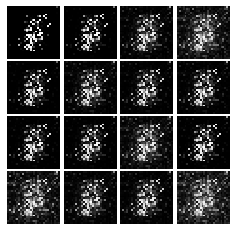

Epoch: 0, Iter: 400, D: 0.1013, G:0.5205


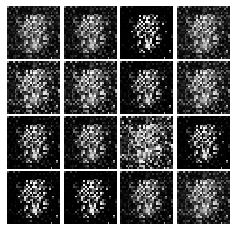

Epoch: 0, Iter: 420, D: 0.0945, G:0.412


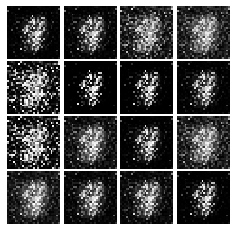

Epoch: 0, Iter: 440, D: 0.1114, G:0.7684


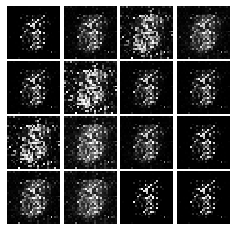

Epoch: 0, Iter: 460, D: 0.1029, G:0.2983


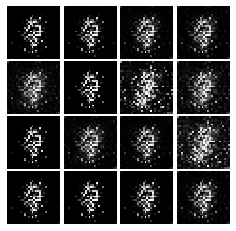

Epoch: 1, Iter: 480, D: 0.08605, G:0.3744


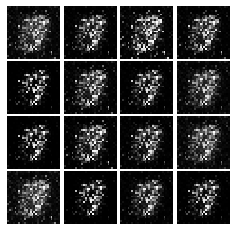

Epoch: 1, Iter: 500, D: 0.0835, G:0.4264


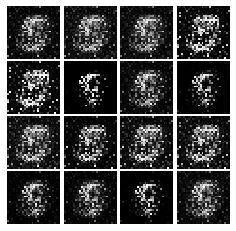

Epoch: 1, Iter: 520, D: 0.07349, G:0.525


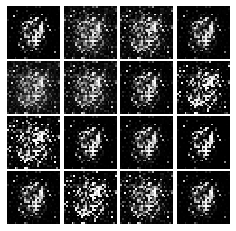

Epoch: 1, Iter: 540, D: 0.1413, G:0.257


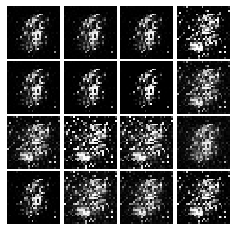

Epoch: 1, Iter: 560, D: 0.06557, G:0.4796


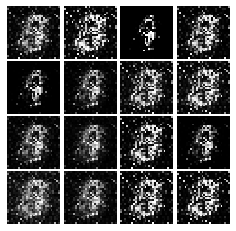

Epoch: 1, Iter: 580, D: 0.1193, G:0.2798


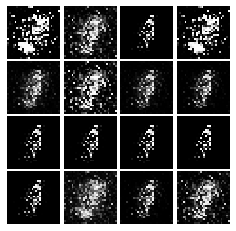

Epoch: 1, Iter: 600, D: 0.1117, G:0.2547


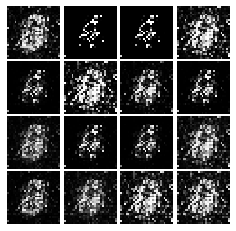

Epoch: 1, Iter: 620, D: 0.07723, G:0.5889


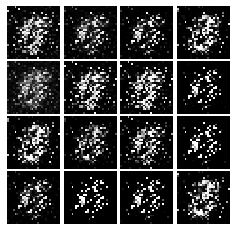

Epoch: 1, Iter: 640, D: 0.06819, G:0.5716


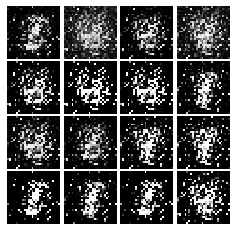

Epoch: 1, Iter: 660, D: 0.2516, G:0.2257


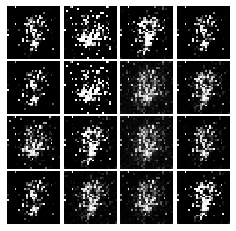

Epoch: 1, Iter: 680, D: 0.1526, G:0.428


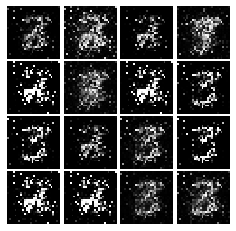

Epoch: 1, Iter: 700, D: 0.1138, G:0.3798


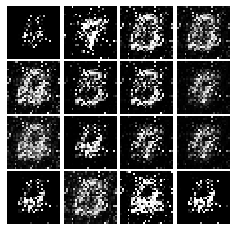

Epoch: 1, Iter: 720, D: 0.1985, G:0.2962


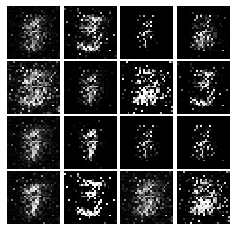

Epoch: 1, Iter: 740, D: 0.1638, G:0.3489


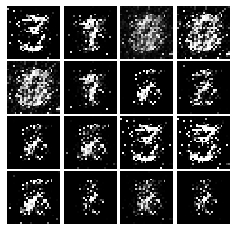

Epoch: 1, Iter: 760, D: 0.1644, G:0.4963


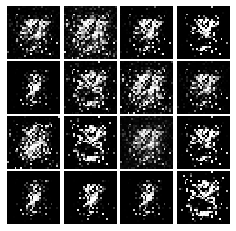

Epoch: 1, Iter: 780, D: 0.1381, G:0.3507


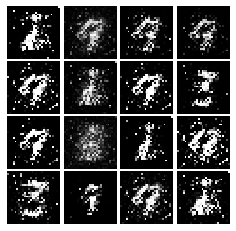

Epoch: 1, Iter: 800, D: 0.1386, G:0.2497


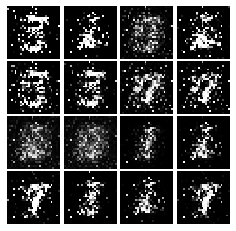

Epoch: 1, Iter: 820, D: 0.1645, G:0.377


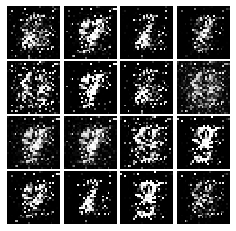

Epoch: 1, Iter: 840, D: 0.1334, G:0.1742


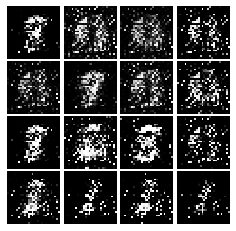

Epoch: 1, Iter: 860, D: 0.1726, G:0.2843


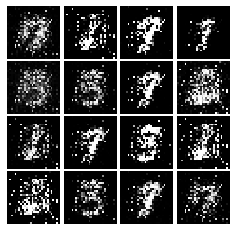

Epoch: 1, Iter: 880, D: 0.1563, G:0.3672


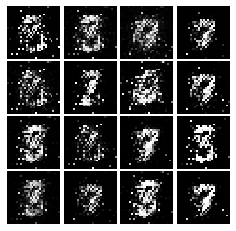

Epoch: 1, Iter: 900, D: 0.1165, G:0.3842


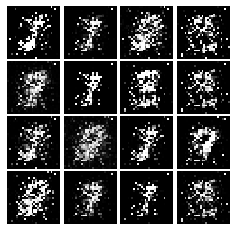

Epoch: 1, Iter: 920, D: 0.1814, G:0.2099


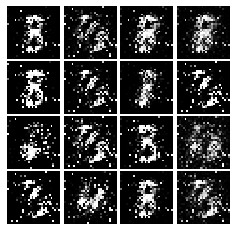

Epoch: 2, Iter: 940, D: 0.1844, G:0.2191


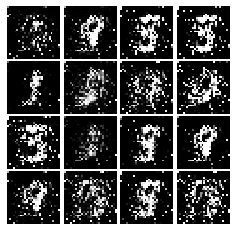

Epoch: 2, Iter: 960, D: 0.2152, G:0.3404


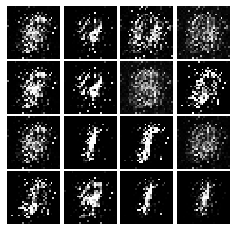

Epoch: 2, Iter: 980, D: 0.1374, G:0.2826


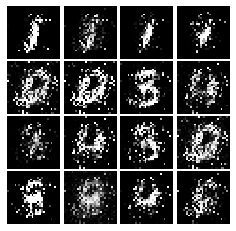

Epoch: 2, Iter: 1000, D: 0.09487, G:0.5333


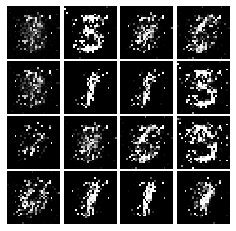

Epoch: 2, Iter: 1020, D: 0.139, G:0.3021


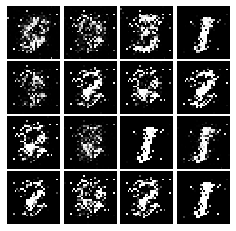

Epoch: 2, Iter: 1040, D: 0.09474, G:0.4152


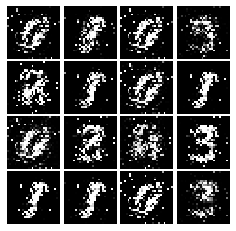

Epoch: 2, Iter: 1060, D: 0.1453, G:0.297


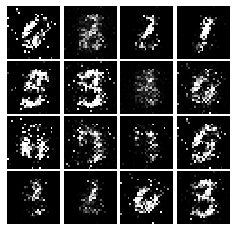

Epoch: 2, Iter: 1080, D: 0.1922, G:1.461


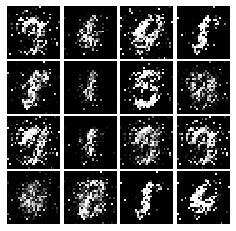

Epoch: 2, Iter: 1100, D: 0.1572, G:0.2713


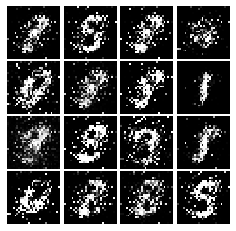

Epoch: 2, Iter: 1120, D: 0.09803, G:0.3478


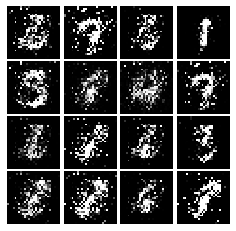

Epoch: 2, Iter: 1140, D: 0.176, G:0.2421


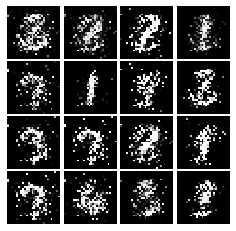

Epoch: 2, Iter: 1160, D: 0.1994, G:0.3144


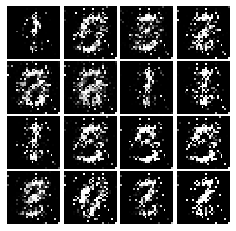

Epoch: 2, Iter: 1180, D: 0.2037, G:0.256


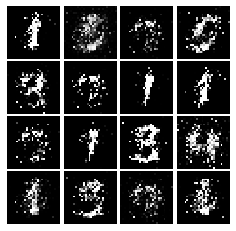

Epoch: 2, Iter: 1200, D: 0.1835, G:0.2842


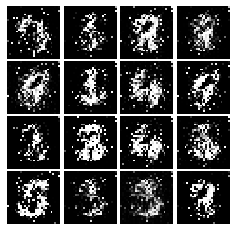

Epoch: 2, Iter: 1220, D: 0.1756, G:0.2891


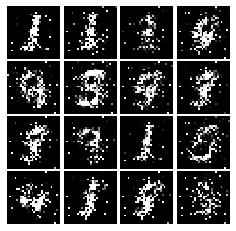

Epoch: 2, Iter: 1240, D: 0.1161, G:0.3614


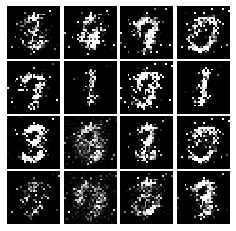

Epoch: 2, Iter: 1260, D: 0.1557, G:0.3508


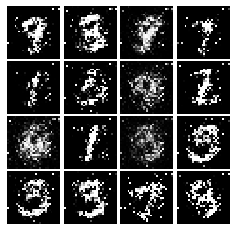

Epoch: 2, Iter: 1280, D: 0.1956, G:0.1359


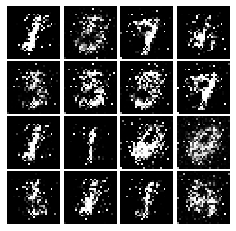

Epoch: 2, Iter: 1300, D: 0.1538, G:0.2849


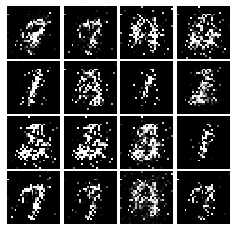

Epoch: 2, Iter: 1320, D: 0.2329, G:0.2404


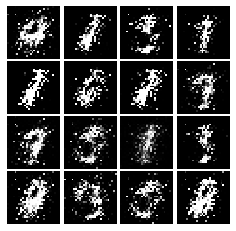

Epoch: 2, Iter: 1340, D: 0.1631, G:0.2674


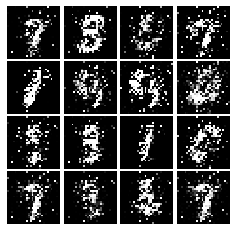

Epoch: 2, Iter: 1360, D: 0.187, G:0.2446


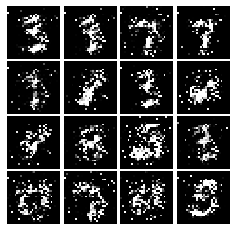

Epoch: 2, Iter: 1380, D: 0.1104, G:0.3688


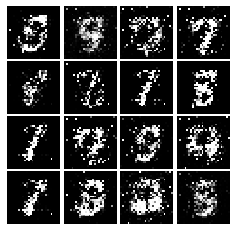

Epoch: 2, Iter: 1400, D: 0.1727, G:0.2839


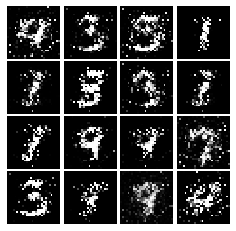

Epoch: 3, Iter: 1420, D: 0.1809, G:0.2562


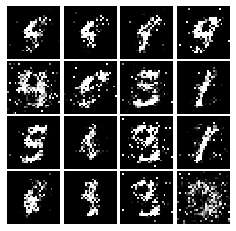

Epoch: 3, Iter: 1440, D: 0.1792, G:0.2222


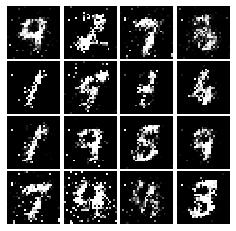

Epoch: 3, Iter: 1460, D: 0.1897, G:0.2369


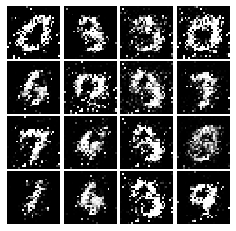

Epoch: 3, Iter: 1480, D: 0.1798, G:0.2637


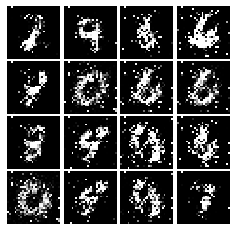

Epoch: 3, Iter: 1500, D: 0.1751, G:0.2954


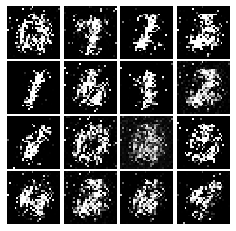

Epoch: 3, Iter: 1520, D: 0.2068, G:0.2593


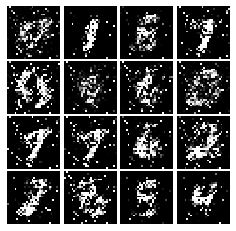

Epoch: 3, Iter: 1540, D: 0.1526, G:0.2584


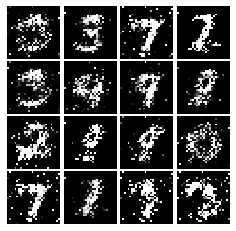

Epoch: 3, Iter: 1560, D: 0.2062, G:0.2051


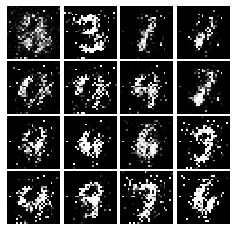

Epoch: 3, Iter: 1580, D: 0.1742, G:0.2453


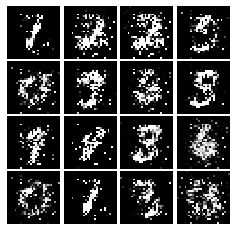

Epoch: 3, Iter: 1600, D: 0.1894, G:0.1912


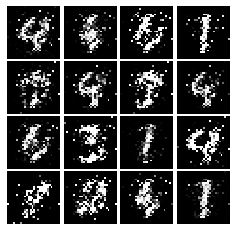

Epoch: 3, Iter: 1620, D: 0.1364, G:0.2841


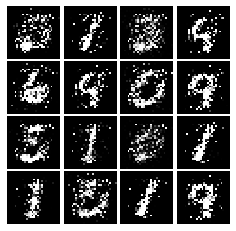

Epoch: 3, Iter: 1640, D: 0.1486, G:0.3236


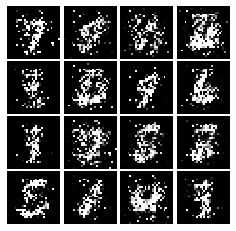

Epoch: 3, Iter: 1660, D: 0.1748, G:0.3272


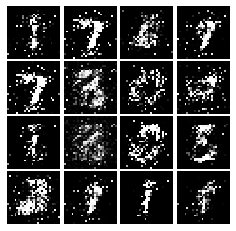

Epoch: 3, Iter: 1680, D: 0.1859, G:0.2311


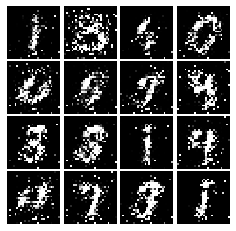

Epoch: 3, Iter: 1700, D: 0.1415, G:0.5163


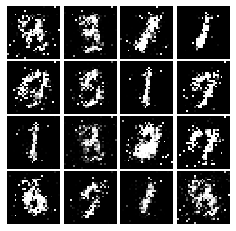

Epoch: 3, Iter: 1720, D: 0.1628, G:0.8985


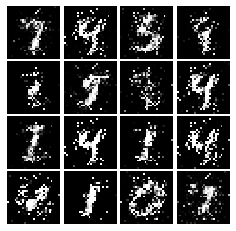

Epoch: 3, Iter: 1740, D: 0.1723, G:0.2711


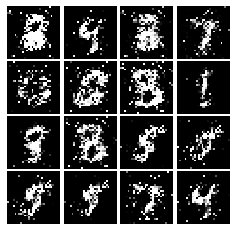

Epoch: 3, Iter: 1760, D: 0.1601, G:0.2878


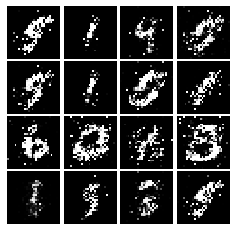

Epoch: 3, Iter: 1780, D: 0.1647, G:0.2614


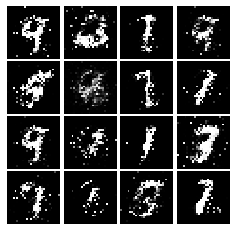

Epoch: 3, Iter: 1800, D: 0.1883, G:0.2717


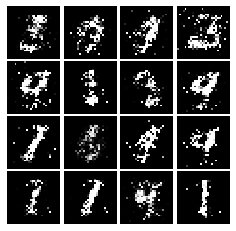

Epoch: 3, Iter: 1820, D: 0.1818, G:0.2479


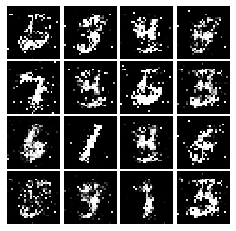

Epoch: 3, Iter: 1840, D: 0.1886, G:0.2181


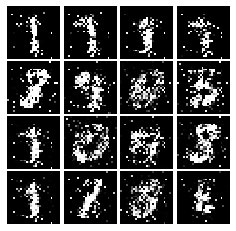

Epoch: 3, Iter: 1860, D: 0.164, G:0.2933


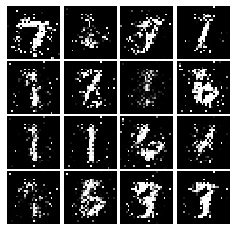

Epoch: 4, Iter: 1880, D: 0.187, G:0.2384


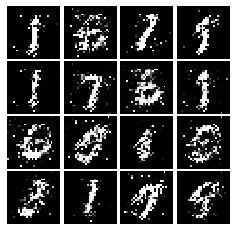

Epoch: 4, Iter: 1900, D: 0.1839, G:0.2024


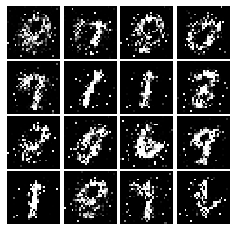

Epoch: 4, Iter: 1920, D: 0.1871, G:0.2835


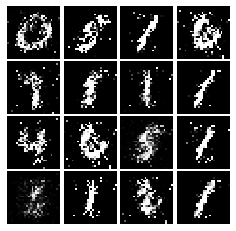

Epoch: 4, Iter: 1940, D: 0.2028, G:0.2554


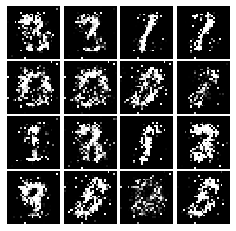

Epoch: 4, Iter: 1960, D: 0.1997, G:0.219


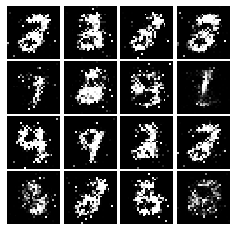

Epoch: 4, Iter: 1980, D: 0.2097, G:0.2362


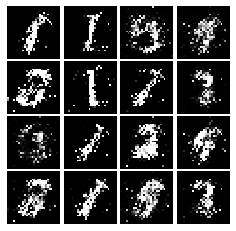

Epoch: 4, Iter: 2000, D: 0.223, G:0.2165


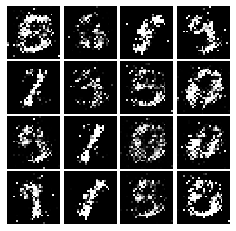

Epoch: 4, Iter: 2020, D: 0.1598, G:0.2317


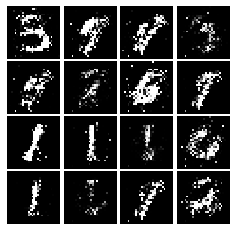

Epoch: 4, Iter: 2040, D: 0.2042, G:0.1863


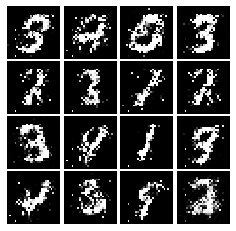

Epoch: 4, Iter: 2060, D: 0.2234, G:0.2335


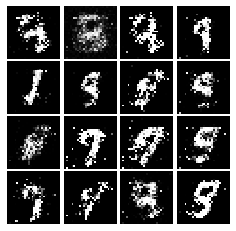

Epoch: 4, Iter: 2080, D: 0.2016, G:0.1863


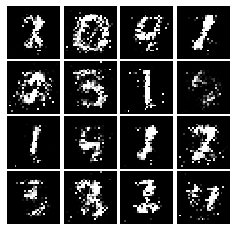

Epoch: 4, Iter: 2100, D: 0.2011, G:0.1877


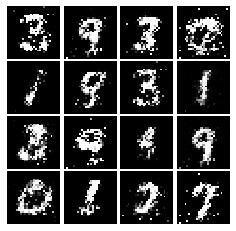

Epoch: 4, Iter: 2120, D: 0.218, G:0.1903


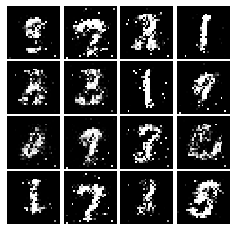

Epoch: 4, Iter: 2140, D: 0.2305, G:0.2371


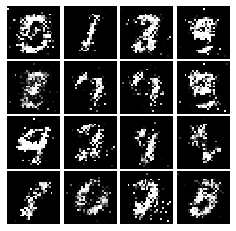

Epoch: 4, Iter: 2160, D: 0.1978, G:0.1809


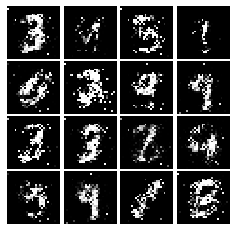

Epoch: 4, Iter: 2180, D: 0.2217, G:0.2158


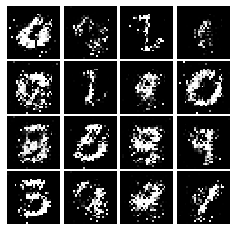

Epoch: 4, Iter: 2200, D: 0.2055, G:0.1934


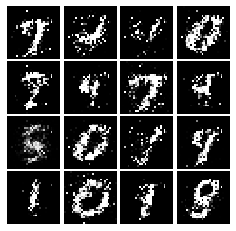

Epoch: 4, Iter: 2220, D: 0.2157, G:0.1904


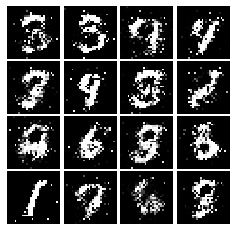

Epoch: 4, Iter: 2240, D: 0.2157, G:0.1926


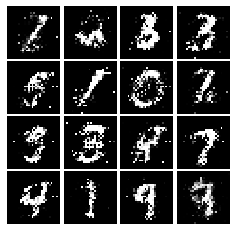

Epoch: 4, Iter: 2260, D: 0.2057, G:0.2113


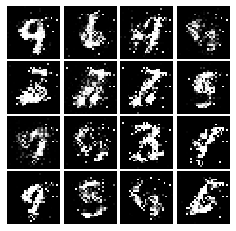

Epoch: 4, Iter: 2280, D: 0.1922, G:0.2176


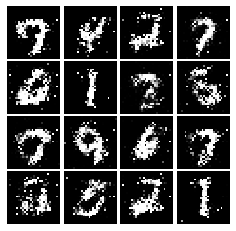

Epoch: 4, Iter: 2300, D: 0.2227, G:0.2016


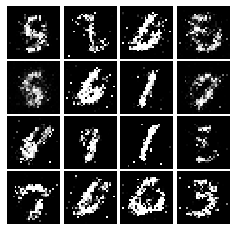

Epoch: 4, Iter: 2320, D: 0.2036, G:0.1897


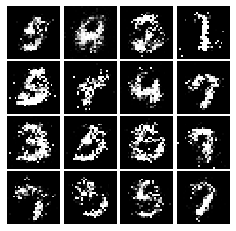

Epoch: 4, Iter: 2340, D: 0.204, G:0.2056


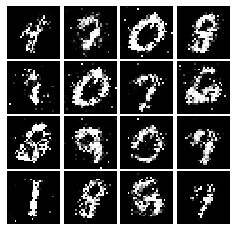

Epoch: 5, Iter: 2360, D: 0.2131, G:0.214


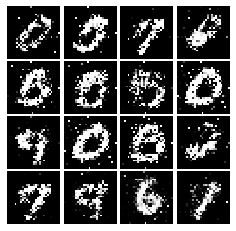

Epoch: 5, Iter: 2380, D: 0.199, G:0.1991


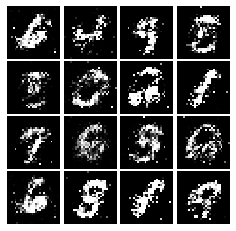

Epoch: 5, Iter: 2400, D: 0.2213, G:0.1878


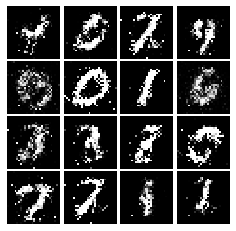

Epoch: 5, Iter: 2420, D: 0.193, G:0.1824


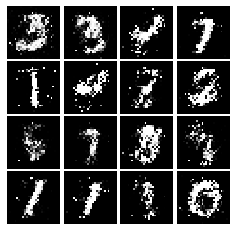

Epoch: 5, Iter: 2440, D: 0.2094, G:0.1977


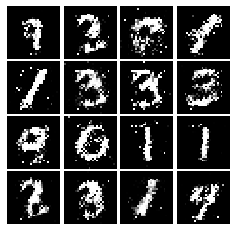

Epoch: 5, Iter: 2460, D: 0.204, G:0.1945


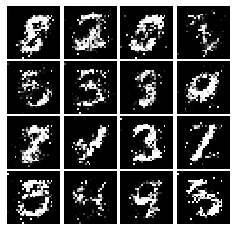

Epoch: 5, Iter: 2480, D: 0.2187, G:0.1893


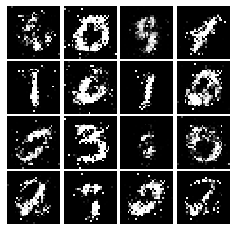

Epoch: 5, Iter: 2500, D: 0.1675, G:0.2523


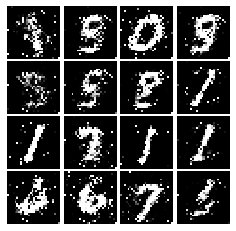

Epoch: 5, Iter: 2520, D: 0.2481, G:0.244


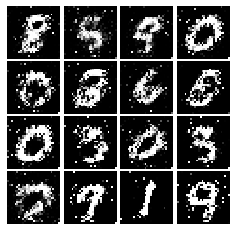

Epoch: 5, Iter: 2540, D: 0.2337, G:0.1511


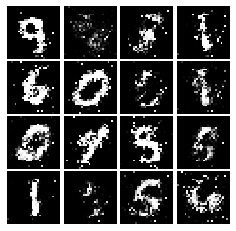

Epoch: 5, Iter: 2560, D: 0.2409, G:0.1653


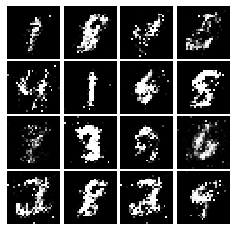

Epoch: 5, Iter: 2580, D: 0.2173, G:0.2002


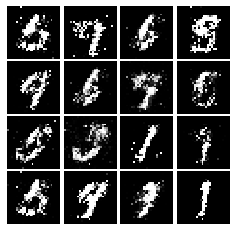

Epoch: 5, Iter: 2600, D: 0.2813, G:0.1423


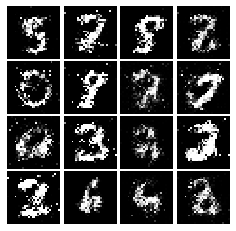

Epoch: 5, Iter: 2620, D: 0.2081, G:0.2031


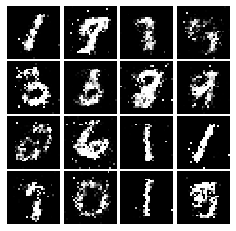

Epoch: 5, Iter: 2640, D: 0.1854, G:0.2084


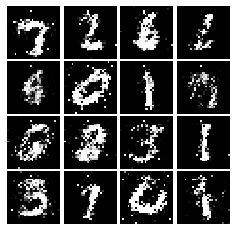

Epoch: 5, Iter: 2660, D: 0.2151, G:0.1425


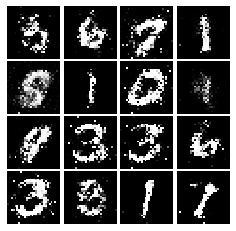

Epoch: 5, Iter: 2680, D: 0.2569, G:0.1799


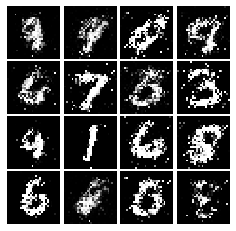

Epoch: 5, Iter: 2700, D: 0.2283, G:0.1618


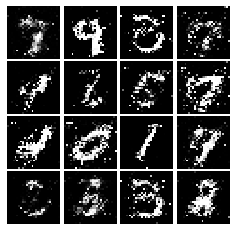

Epoch: 5, Iter: 2720, D: 0.2361, G:0.1555


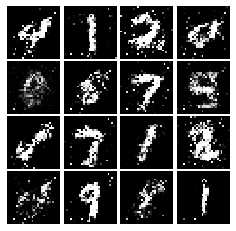

Epoch: 5, Iter: 2740, D: 0.2605, G:0.194


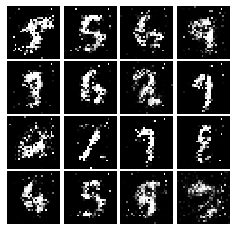

Epoch: 5, Iter: 2760, D: 0.2239, G:0.1722


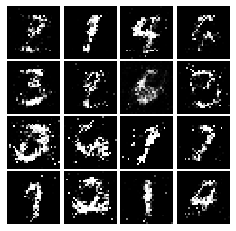

Epoch: 5, Iter: 2780, D: 0.228, G:0.1979


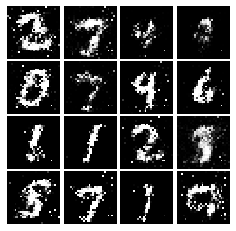

Epoch: 5, Iter: 2800, D: 0.2012, G:0.1946


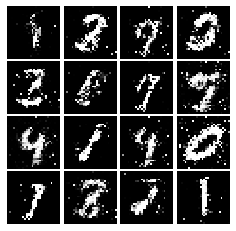

Epoch: 6, Iter: 2820, D: 0.2324, G:0.1615


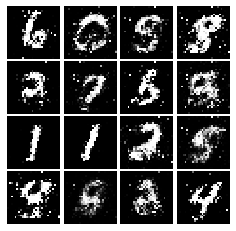

Epoch: 6, Iter: 2840, D: 0.2111, G:0.19


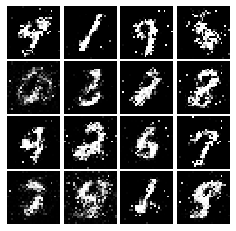

Epoch: 6, Iter: 2860, D: 0.2114, G:0.191


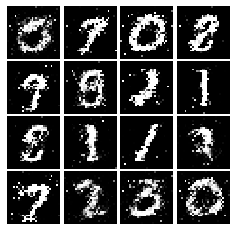

Epoch: 6, Iter: 2880, D: 0.2164, G:0.2085


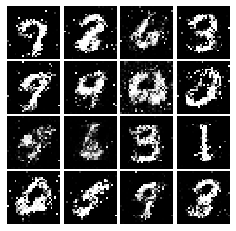

Epoch: 6, Iter: 2900, D: 0.2332, G:0.1938


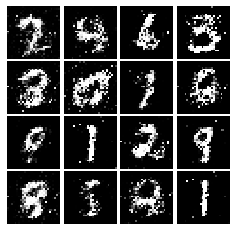

Epoch: 6, Iter: 2920, D: 0.2493, G:0.1845


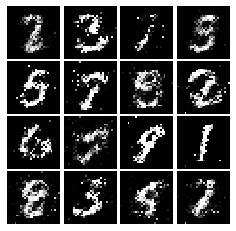

Epoch: 6, Iter: 2940, D: 0.1997, G:0.1796


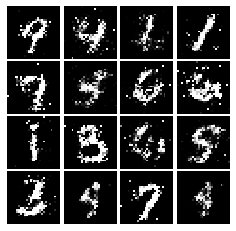

Epoch: 6, Iter: 2960, D: 0.2237, G:0.2152


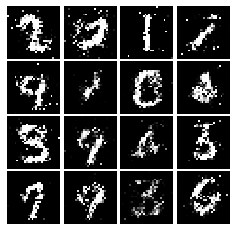

Epoch: 6, Iter: 2980, D: 0.2362, G:0.1759


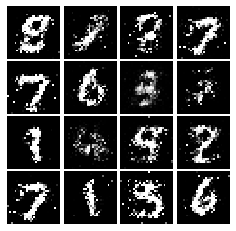

Epoch: 6, Iter: 3000, D: 0.2403, G:0.1864


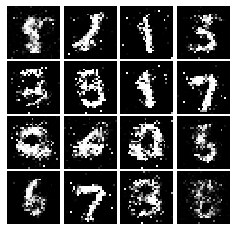

Epoch: 6, Iter: 3020, D: 0.2193, G:0.1629


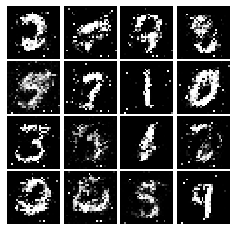

Epoch: 6, Iter: 3040, D: 0.2089, G:0.1947


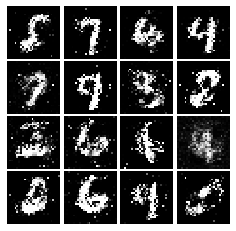

Epoch: 6, Iter: 3060, D: 0.2276, G:0.1584


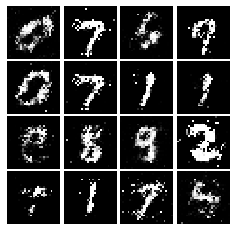

Epoch: 6, Iter: 3080, D: 0.2589, G:0.2025


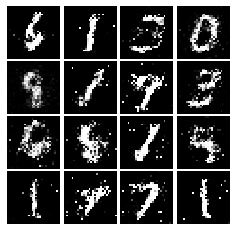

Epoch: 6, Iter: 3100, D: 0.2275, G:0.1657


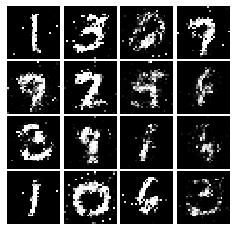

Epoch: 6, Iter: 3120, D: 0.2224, G:0.1525


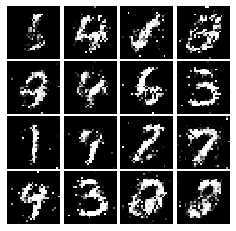

Epoch: 6, Iter: 3140, D: 0.2344, G:0.1642


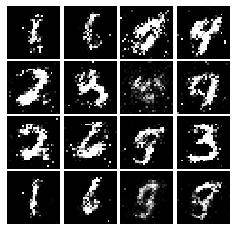

Epoch: 6, Iter: 3160, D: 0.213, G:0.1868


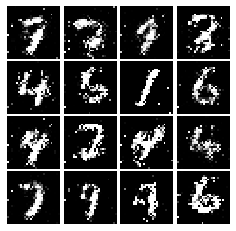

Epoch: 6, Iter: 3180, D: 0.2212, G:0.168


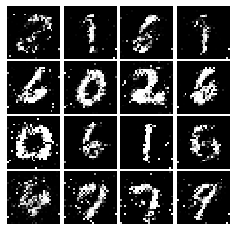

Epoch: 6, Iter: 3200, D: 0.2087, G:0.2033


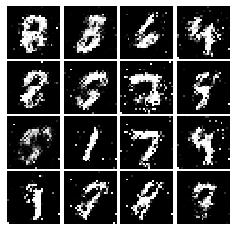

Epoch: 6, Iter: 3220, D: 0.2331, G:0.1759


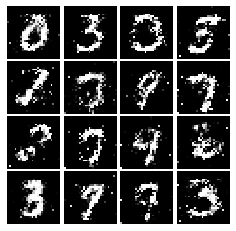

Epoch: 6, Iter: 3240, D: 0.211, G:0.1512


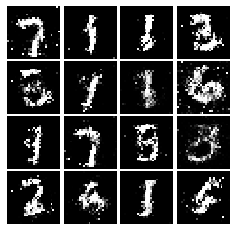

Epoch: 6, Iter: 3260, D: 0.2412, G:0.1647


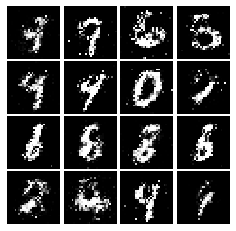

Epoch: 6, Iter: 3280, D: 0.2325, G:0.1893


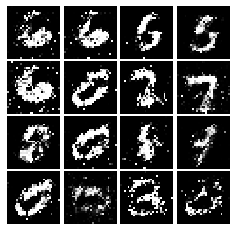

Epoch: 7, Iter: 3300, D: 0.2023, G:0.1858


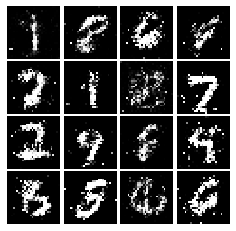

Epoch: 7, Iter: 3320, D: 0.2126, G:0.1772


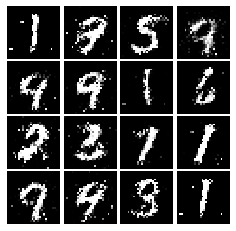

Epoch: 7, Iter: 3340, D: 0.2076, G:0.1835


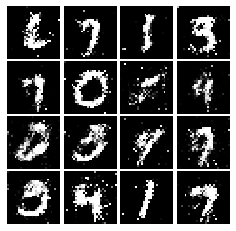

Epoch: 7, Iter: 3360, D: 0.2472, G:0.1813


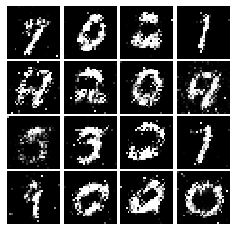

Epoch: 7, Iter: 3380, D: 0.211, G:0.1695


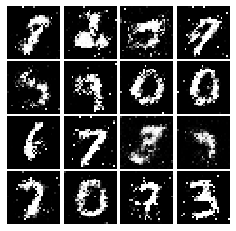

Epoch: 7, Iter: 3400, D: 0.2467, G:0.1603


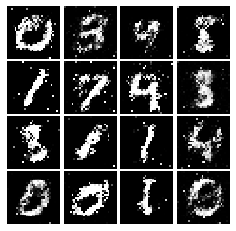

Epoch: 7, Iter: 3420, D: 0.218, G:0.1824


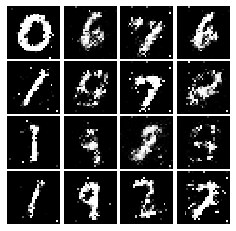

Epoch: 7, Iter: 3440, D: 0.2328, G:0.1953


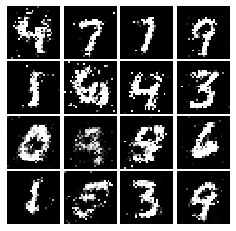

Epoch: 7, Iter: 3460, D: 0.2181, G:0.1667


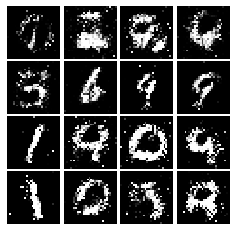

Epoch: 7, Iter: 3480, D: 0.2233, G:0.1716


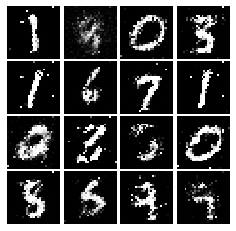

Epoch: 7, Iter: 3500, D: 0.241, G:0.1802


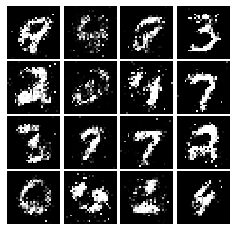

Epoch: 7, Iter: 3520, D: 0.2282, G:0.1524


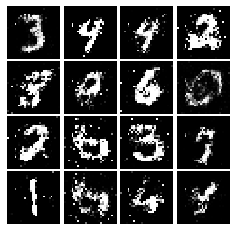

Epoch: 7, Iter: 3540, D: 0.2206, G:0.1631


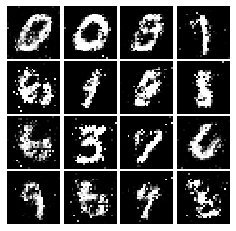

Epoch: 7, Iter: 3560, D: 0.2181, G:0.1477


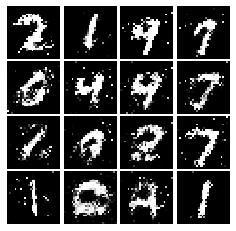

Epoch: 7, Iter: 3580, D: 0.226, G:0.1823


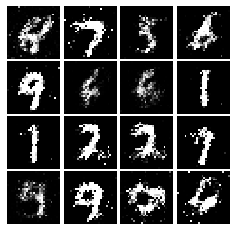

Epoch: 7, Iter: 3600, D: 0.2316, G:0.1644


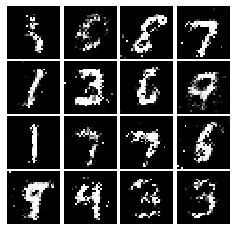

Epoch: 7, Iter: 3620, D: 0.2136, G:0.1734


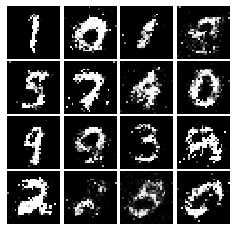

Epoch: 7, Iter: 3640, D: 0.2306, G:0.1776


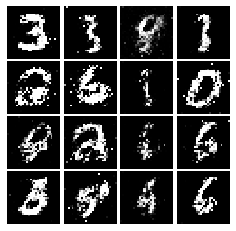

Epoch: 7, Iter: 3660, D: 0.2094, G:0.1625


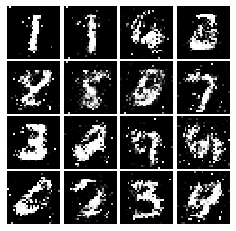

Epoch: 7, Iter: 3680, D: 0.2193, G:0.1646


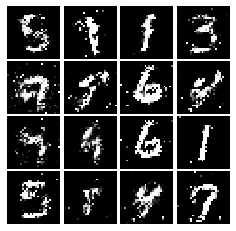

Epoch: 7, Iter: 3700, D: 0.2243, G:0.1688


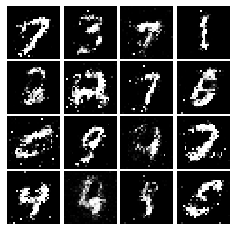

Epoch: 7, Iter: 3720, D: 0.2256, G:0.1922


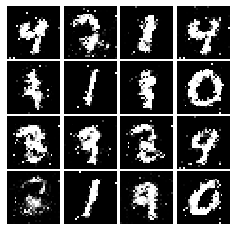

Epoch: 7, Iter: 3740, D: 0.2288, G:0.1496


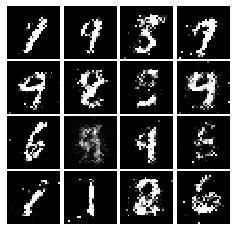

Epoch: 8, Iter: 3760, D: 0.2327, G:0.1682


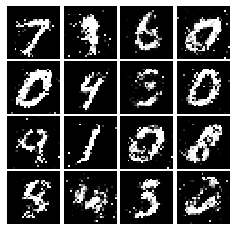

Epoch: 8, Iter: 3780, D: 0.229, G:0.1559


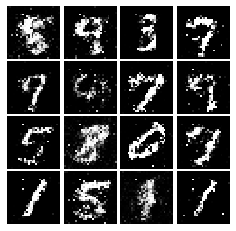

Epoch: 8, Iter: 3800, D: 0.227, G:0.1517


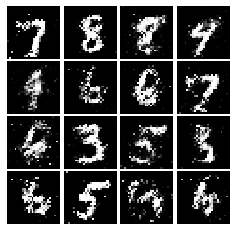

Epoch: 8, Iter: 3820, D: 0.2514, G:0.1682


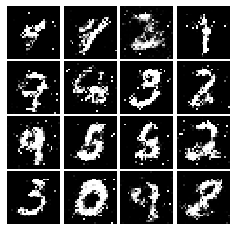

Epoch: 8, Iter: 3840, D: 0.2213, G:0.1498


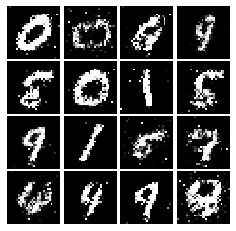

Epoch: 8, Iter: 3860, D: 0.2305, G:0.189


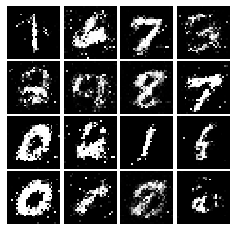

Epoch: 8, Iter: 3880, D: 0.2263, G:0.1646


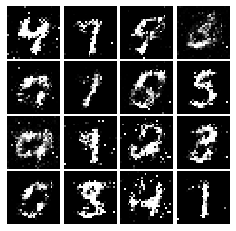

Epoch: 8, Iter: 3900, D: 0.2383, G:0.1706


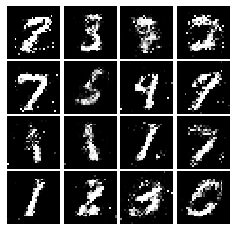

Epoch: 8, Iter: 3920, D: 0.2286, G:0.1668


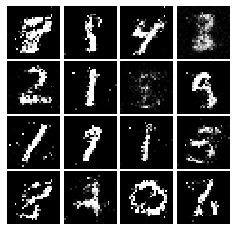

Epoch: 8, Iter: 3940, D: 0.2354, G:0.1507


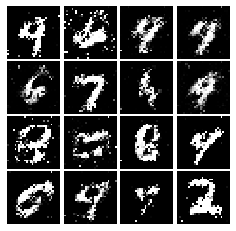

Epoch: 8, Iter: 3960, D: 0.2236, G:0.1749


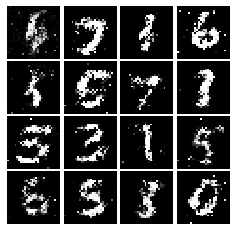

Epoch: 8, Iter: 3980, D: 0.1999, G:0.1819


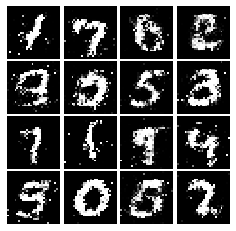

Epoch: 8, Iter: 4000, D: 0.2493, G:0.199


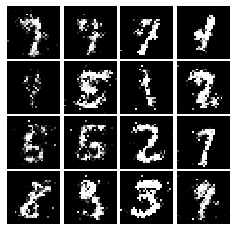

Epoch: 8, Iter: 4020, D: 0.2232, G:0.1479


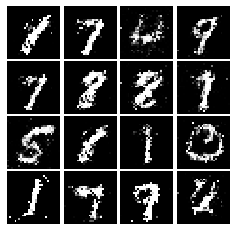

Epoch: 8, Iter: 4040, D: 0.2196, G:0.1766


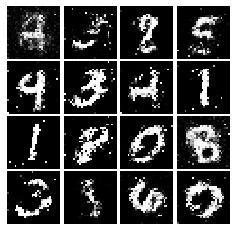

Epoch: 8, Iter: 4060, D: 0.2237, G:0.166


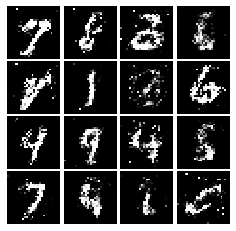

Epoch: 8, Iter: 4080, D: 0.2585, G:0.1485


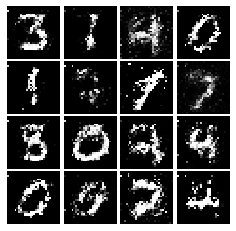

Epoch: 8, Iter: 4100, D: 0.2449, G:0.1502


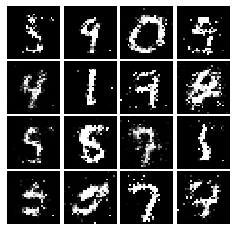

Epoch: 8, Iter: 4120, D: 0.2154, G:0.154


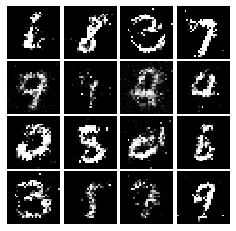

Epoch: 8, Iter: 4140, D: 0.248, G:0.1934


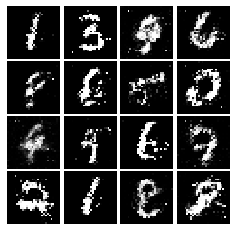

Epoch: 8, Iter: 4160, D: 0.2348, G:0.1937


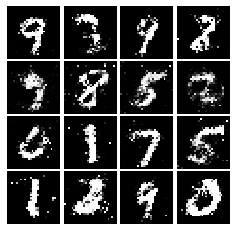

Epoch: 8, Iter: 4180, D: 0.2375, G:0.1756


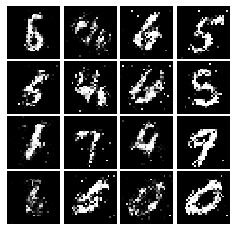

Epoch: 8, Iter: 4200, D: 0.2427, G:0.1493


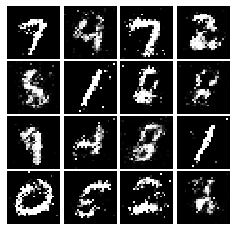

Epoch: 8, Iter: 4220, D: 0.2114, G:0.2183


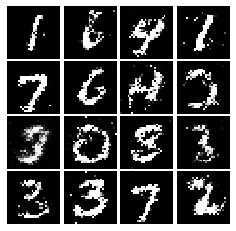

Epoch: 9, Iter: 4240, D: 0.2434, G:0.1546


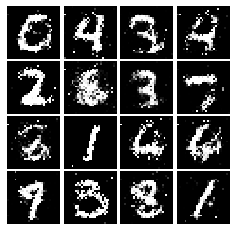

Epoch: 9, Iter: 4260, D: 0.2646, G:0.1532


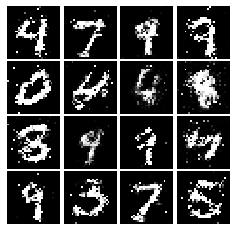

Epoch: 9, Iter: 4280, D: 0.2363, G:0.1758


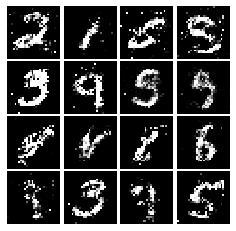

Epoch: 9, Iter: 4300, D: 0.2437, G:0.1677


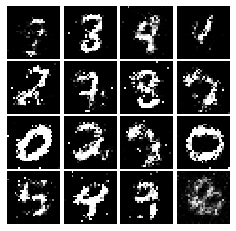

Epoch: 9, Iter: 4320, D: 0.2386, G:0.1553


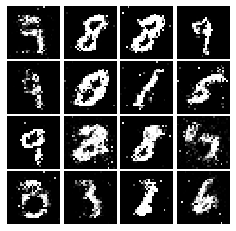

Epoch: 9, Iter: 4340, D: 0.2456, G:0.1536


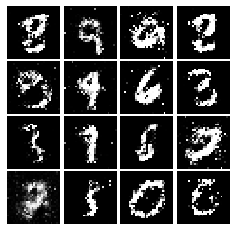

Epoch: 9, Iter: 4360, D: 0.2398, G:0.1395


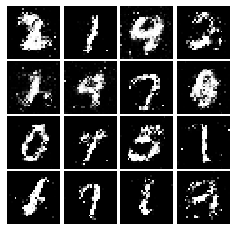

Epoch: 9, Iter: 4380, D: 0.2365, G:0.1369


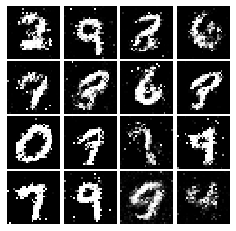

Epoch: 9, Iter: 4400, D: 0.2197, G:0.1784


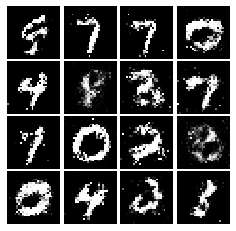

Epoch: 9, Iter: 4420, D: 0.2175, G:0.137


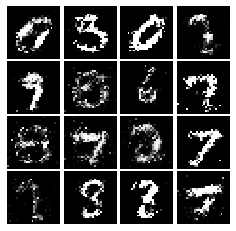

Epoch: 9, Iter: 4440, D: 0.2334, G:0.1628


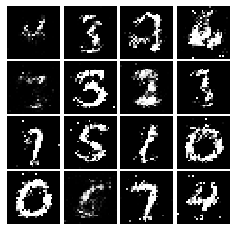

Epoch: 9, Iter: 4460, D: 0.2323, G:0.1533


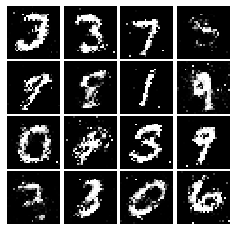

Epoch: 9, Iter: 4480, D: 0.2419, G:0.1849


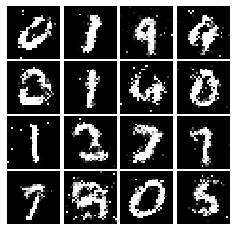

Epoch: 9, Iter: 4500, D: 0.2619, G:0.1659


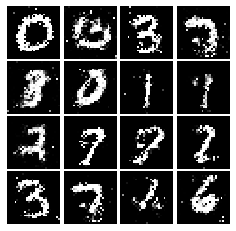

Epoch: 9, Iter: 4520, D: 0.2339, G:0.1601


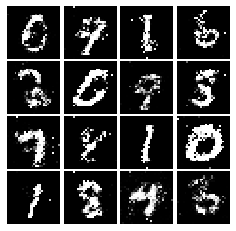

Epoch: 9, Iter: 4540, D: 0.2449, G:0.144


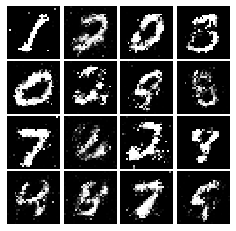

Epoch: 9, Iter: 4560, D: 0.231, G:0.1708


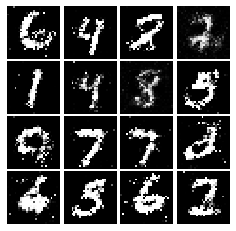

Epoch: 9, Iter: 4580, D: 0.2351, G:0.1742


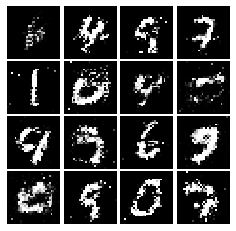

Epoch: 9, Iter: 4600, D: 0.2462, G:0.1829


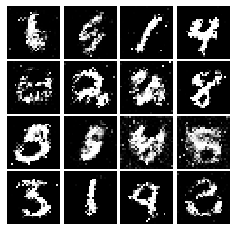

Epoch: 9, Iter: 4620, D: 0.2178, G:0.1815


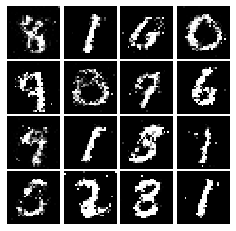

Epoch: 9, Iter: 4640, D: 0.2343, G:0.1438


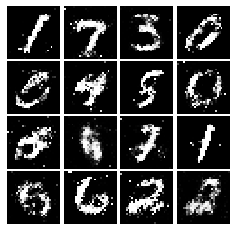

Epoch: 9, Iter: 4660, D: 0.224, G:0.1605


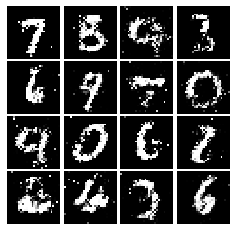

Epoch: 9, Iter: 4680, D: 0.2398, G:0.25


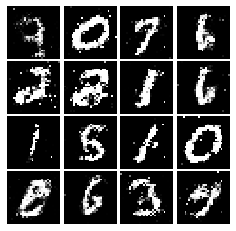

Final images


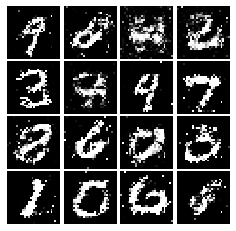

In [61]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [18]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#         pass
        tf.keras.layers.Reshape(input_shape=(784,), target_shape=(28,28,1)),
        tf.keras.layers.Conv2D(filters=32, kernel_size=5, strides=1, padding='VALID', use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2),
        tf.keras.layers.Conv2D(filters=64, kernel_size=5, strides=1, padding='VALID', use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=4*4*64, use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(units=1, use_bias=True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [19]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
        tf.keras.layers.Dense(input_shape=(noise_dim,), units=1024, use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(units=7*7*128, use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape(target_shape=(7,7,128)),
        tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=4, strides=2, padding='SAME'),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=4, strides=2, padding='SAME', activation='tanh'),
        
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.368, G:0.6525


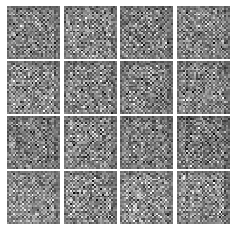

Epoch: 0, Iter: 20, D: 0.2796, G:2.072


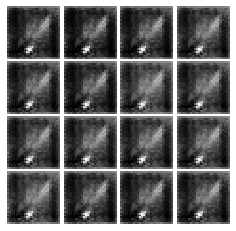

Epoch: 0, Iter: 40, D: 1.709, G:2.202


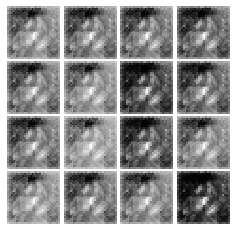

Epoch: 0, Iter: 60, D: 0.5249, G:2.159


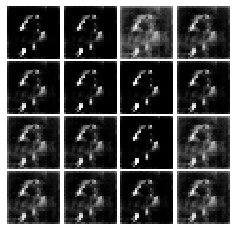

Epoch: 0, Iter: 80, D: 0.7569, G:3.728


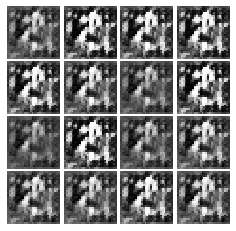

Epoch: 0, Iter: 100, D: 0.1932, G:4.321


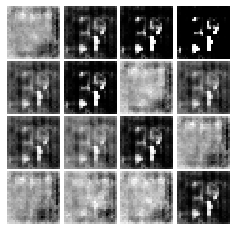

Epoch: 0, Iter: 120, D: 0.3112, G:2.735


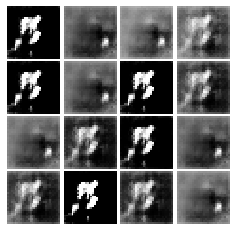

Epoch: 0, Iter: 140, D: 0.8235, G:1.144


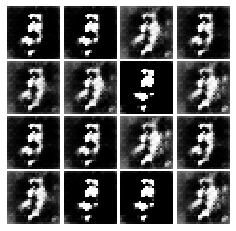

Epoch: 0, Iter: 160, D: 0.1693, G:5.975


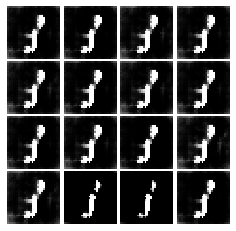

Epoch: 0, Iter: 180, D: 0.0868, G:5.009


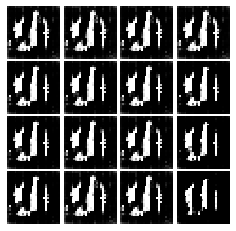

Epoch: 0, Iter: 200, D: 0.03063, G:5.199


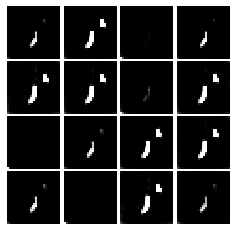

Epoch: 0, Iter: 220, D: 0.02417, G:4.612


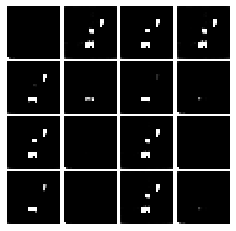

Epoch: 0, Iter: 240, D: 3.975, G:24.72


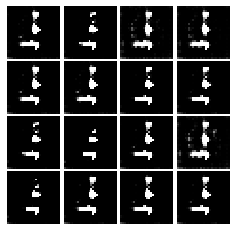

Epoch: 0, Iter: 260, D: 0.0642, G:3.81


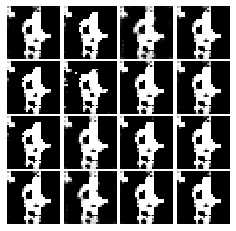

Epoch: 0, Iter: 280, D: 0.3566, G:2.34


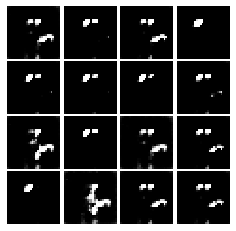

Epoch: 0, Iter: 300, D: 0.137, G:4.131


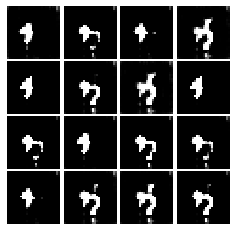

Epoch: 0, Iter: 320, D: 0.9619, G:2.686


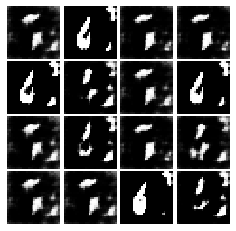

Epoch: 0, Iter: 340, D: 0.4341, G:3.837


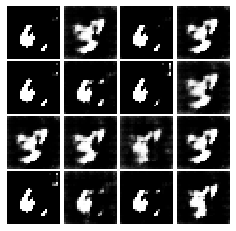

Epoch: 0, Iter: 360, D: 0.5171, G:2.352


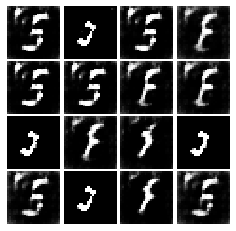

Epoch: 0, Iter: 380, D: 0.3331, G:3.64


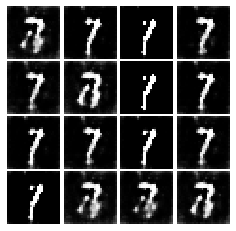

Epoch: 0, Iter: 400, D: 0.4913, G:3.238


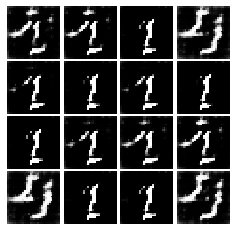

Epoch: 0, Iter: 420, D: 0.473, G:2.376


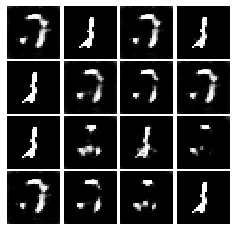

Epoch: 0, Iter: 440, D: 0.7958, G:2.071


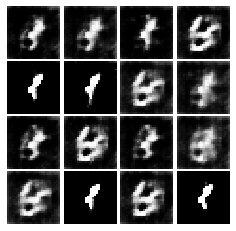

Epoch: 0, Iter: 460, D: 0.3795, G:2.798


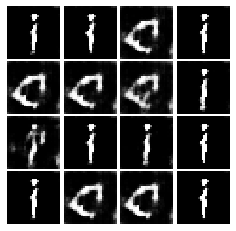

Epoch: 1, Iter: 480, D: 0.2369, G:3.4


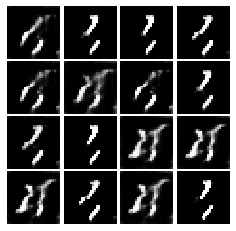

Epoch: 1, Iter: 500, D: 0.8209, G:2.628


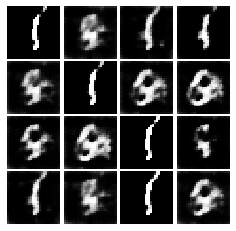

Epoch: 1, Iter: 520, D: 0.4477, G:2.417


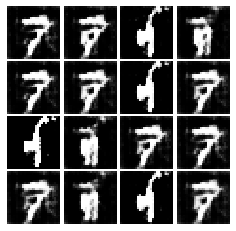

Epoch: 1, Iter: 540, D: 0.8736, G:1.025


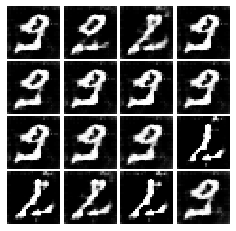

Epoch: 1, Iter: 560, D: 0.3452, G:3.876


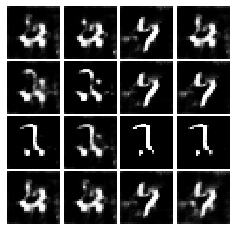

Epoch: 1, Iter: 580, D: 0.3751, G:3.161


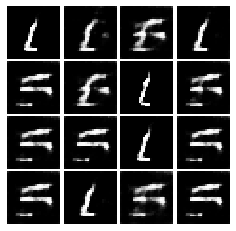

Epoch: 1, Iter: 600, D: 1.222, G:2.666


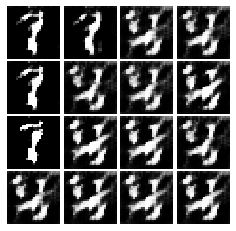

Epoch: 1, Iter: 620, D: 0.06968, G:4.632


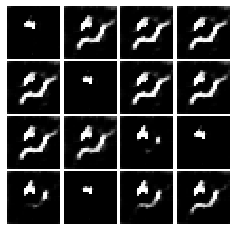

Epoch: 1, Iter: 640, D: 0.7669, G:4.641


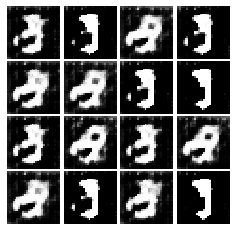

Epoch: 1, Iter: 660, D: 0.5989, G:2.818


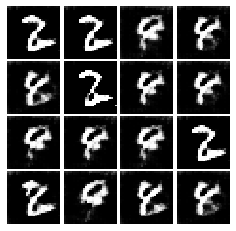

Epoch: 1, Iter: 680, D: 0.3179, G:2.775


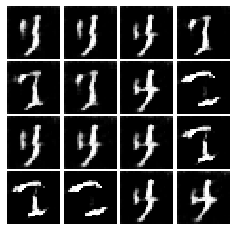

Epoch: 1, Iter: 700, D: 0.6474, G:2.374


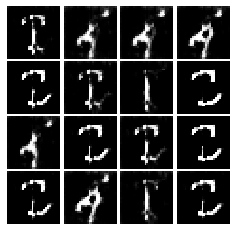

Epoch: 1, Iter: 720, D: 0.5361, G:1.452


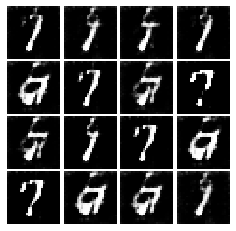

Epoch: 1, Iter: 740, D: 0.4647, G:4.248


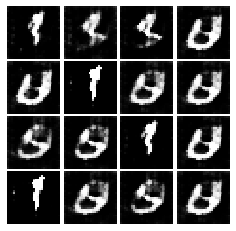

Epoch: 1, Iter: 760, D: 0.2231, G:3.683


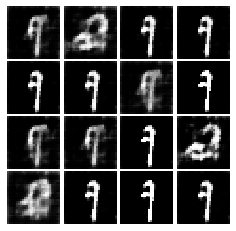

Epoch: 1, Iter: 780, D: 0.3639, G:5.712


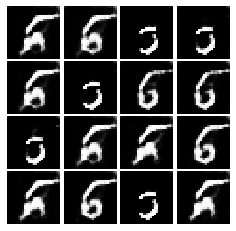

Epoch: 1, Iter: 800, D: 0.3939, G:3.462


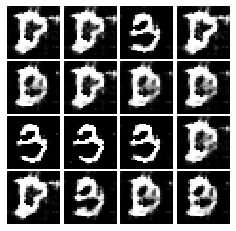

Epoch: 1, Iter: 820, D: 0.4841, G:2.279


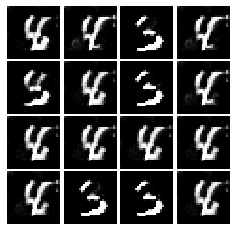

Epoch: 1, Iter: 840, D: 0.7006, G:3.899


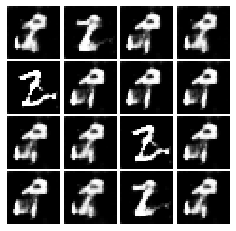

Epoch: 1, Iter: 860, D: 0.2463, G:4.527


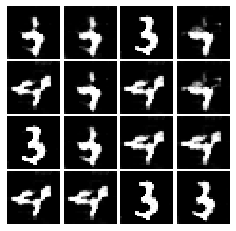

Epoch: 1, Iter: 880, D: 0.2747, G:3.785


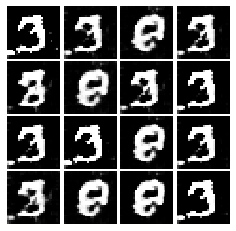

Epoch: 1, Iter: 900, D: 0.3261, G:3.293


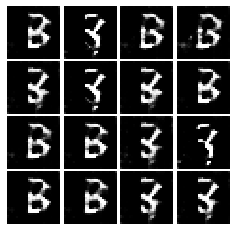

Epoch: 1, Iter: 920, D: 0.5705, G:3.9


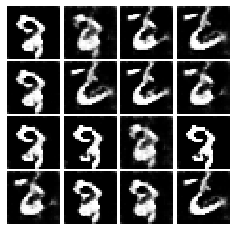

Epoch: 2, Iter: 940, D: 0.2539, G:6.99


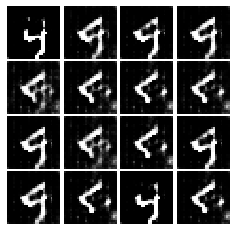

Epoch: 2, Iter: 960, D: 0.3074, G:2.57


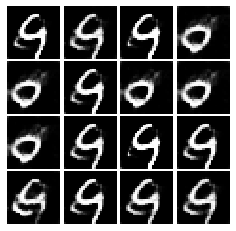

Epoch: 2, Iter: 980, D: 0.6585, G:2.136


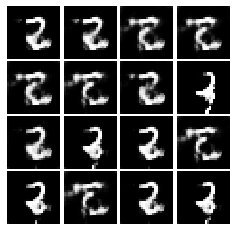

Epoch: 2, Iter: 1000, D: 0.2522, G:3.428


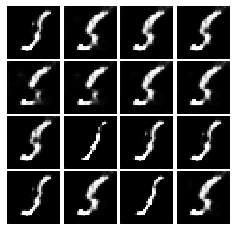

Epoch: 2, Iter: 1020, D: 1.592, G:5.345


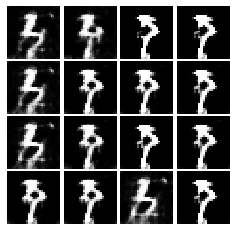

Epoch: 2, Iter: 1040, D: 0.2247, G:4.469


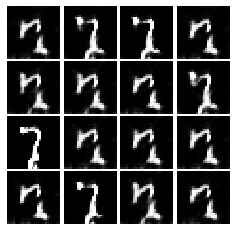

Epoch: 2, Iter: 1060, D: 0.873, G:3.601


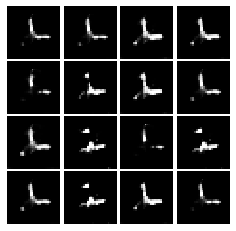

Epoch: 2, Iter: 1080, D: 0.1532, G:4.433


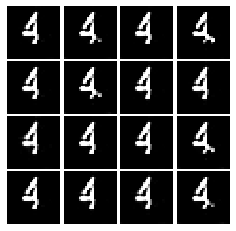

Epoch: 2, Iter: 1100, D: 0.4677, G:3.302


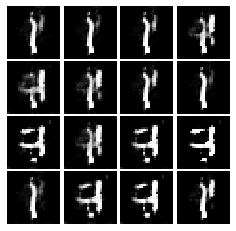

Epoch: 2, Iter: 1120, D: 0.8806, G:2.432


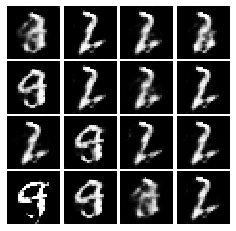

Epoch: 2, Iter: 1140, D: 0.6091, G:2.908


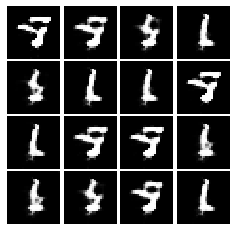

Epoch: 2, Iter: 1160, D: 0.2017, G:3.433


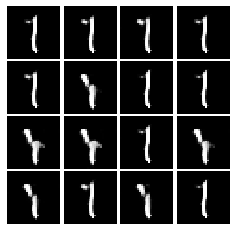

Epoch: 2, Iter: 1180, D: 0.3494, G:3.978


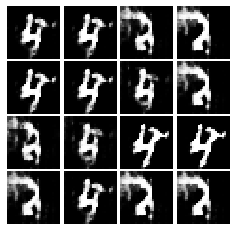

Epoch: 2, Iter: 1200, D: 0.3113, G:3.846


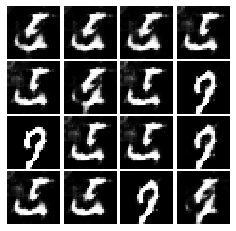

Epoch: 2, Iter: 1220, D: 0.7026, G:4.292


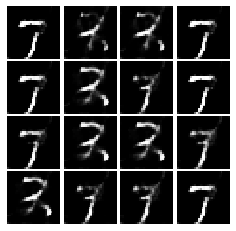

Epoch: 2, Iter: 1240, D: 0.111, G:4.035


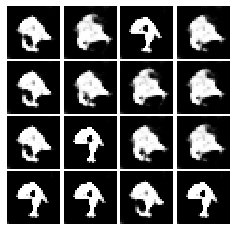

Epoch: 2, Iter: 1260, D: 0.4056, G:5.226


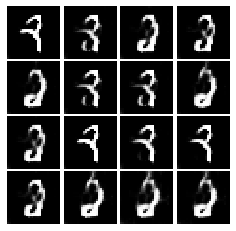

Epoch: 2, Iter: 1280, D: 0.1631, G:4.302


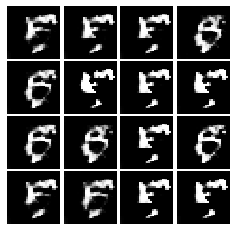

Epoch: 2, Iter: 1300, D: 0.9946, G:7.021


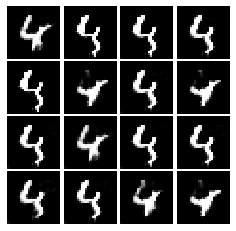

Epoch: 2, Iter: 1320, D: 0.5059, G:4.007


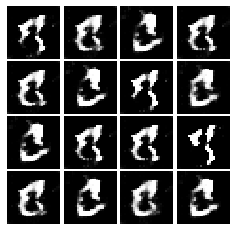

Epoch: 2, Iter: 1340, D: 0.2171, G:3.744


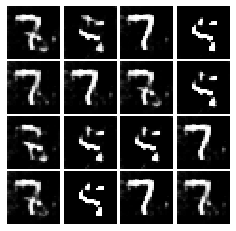

Epoch: 2, Iter: 1360, D: 0.5001, G:3.49


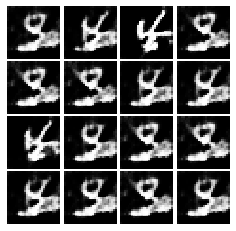

Epoch: 2, Iter: 1380, D: 0.1716, G:4.102


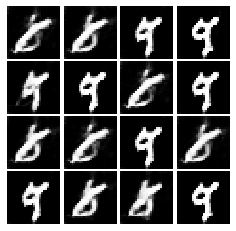

Epoch: 2, Iter: 1400, D: 0.1237, G:3.381


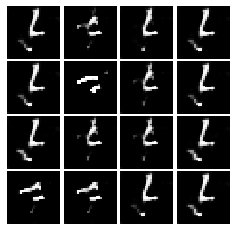

Epoch: 3, Iter: 1420, D: 0.07145, G:4.891


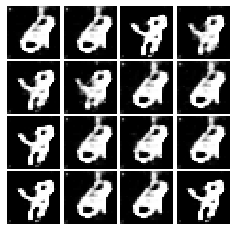

Epoch: 3, Iter: 1440, D: 0.1645, G:3.778


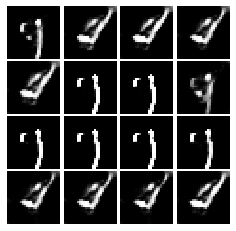

Epoch: 3, Iter: 1460, D: 0.4019, G:3.196


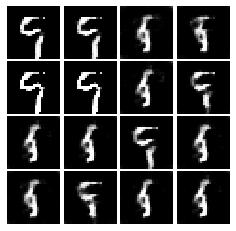

Epoch: 3, Iter: 1480, D: 0.2567, G:2.839


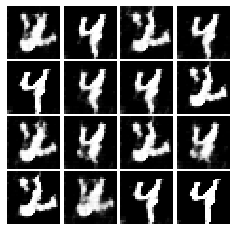

Epoch: 3, Iter: 1500, D: 0.2928, G:4.284


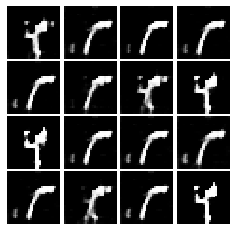

Epoch: 3, Iter: 1520, D: 0.237, G:4.618


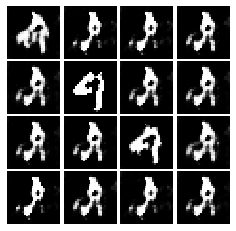

Epoch: 3, Iter: 1540, D: 0.4123, G:5.813


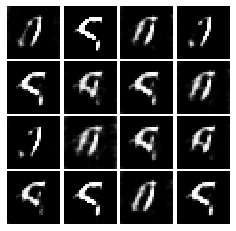

Epoch: 3, Iter: 1560, D: 0.6309, G:3.953


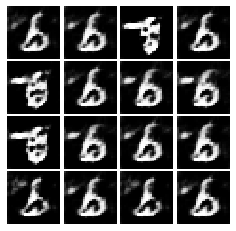

Epoch: 3, Iter: 1580, D: 0.9594, G:8.289


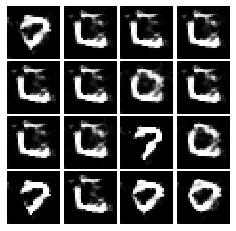

Epoch: 3, Iter: 1600, D: 0.4737, G:2.226


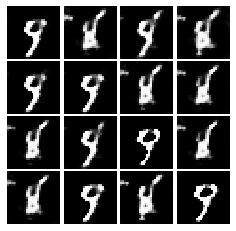

Epoch: 3, Iter: 1620, D: 0.2915, G:4.228


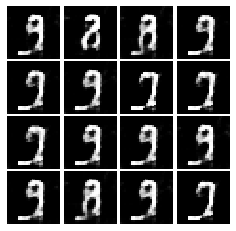

Epoch: 3, Iter: 1640, D: 0.3992, G:4.09


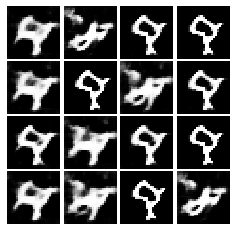

Epoch: 3, Iter: 1660, D: 0.4574, G:5.606


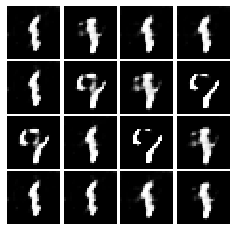

Epoch: 3, Iter: 1680, D: 0.598, G:4.224


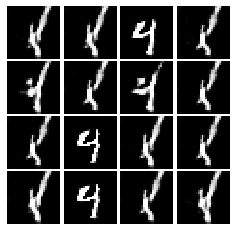

Epoch: 3, Iter: 1700, D: 0.2135, G:5.306


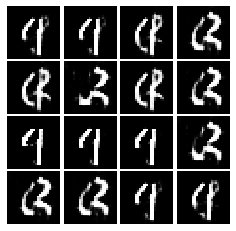

Epoch: 3, Iter: 1720, D: 0.8034, G:3.966


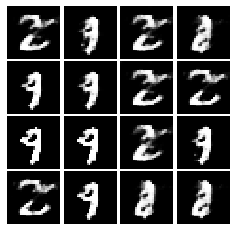

Epoch: 3, Iter: 1740, D: 0.4263, G:3.338


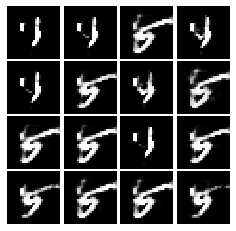

Epoch: 3, Iter: 1760, D: 0.06757, G:4.326


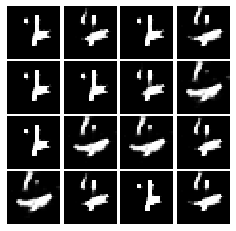

Epoch: 3, Iter: 1780, D: 0.4128, G:6.748


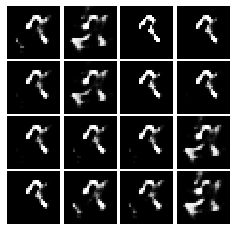

Epoch: 3, Iter: 1800, D: 0.469, G:4.181


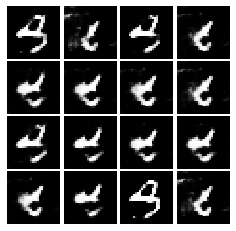

Epoch: 3, Iter: 1820, D: 0.3905, G:4.402


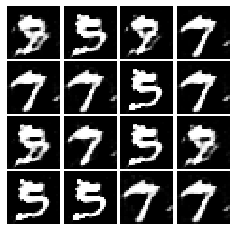

Epoch: 3, Iter: 1840, D: 0.1075, G:4.936


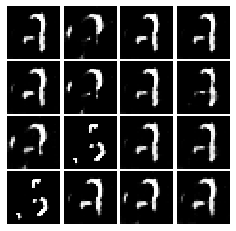

Epoch: 3, Iter: 1860, D: 0.3527, G:4.433


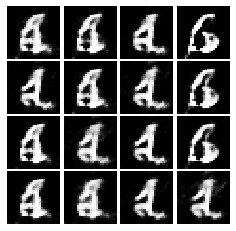

Epoch: 4, Iter: 1880, D: 0.3808, G:3.294


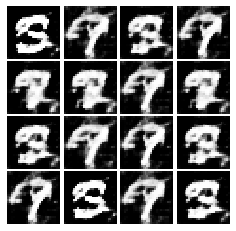

Epoch: 4, Iter: 1900, D: 0.3648, G:2.675


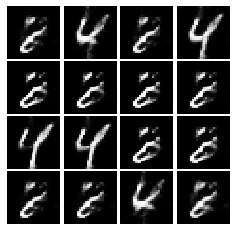

Epoch: 4, Iter: 1920, D: 0.2068, G:3.418


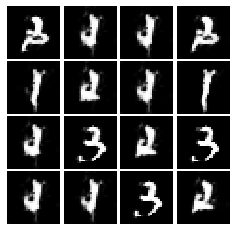

Epoch: 4, Iter: 1940, D: 0.3464, G:3.373


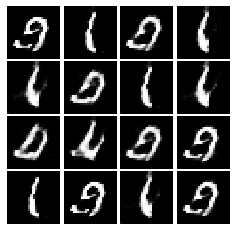

Epoch: 4, Iter: 1960, D: 0.3727, G:5.008


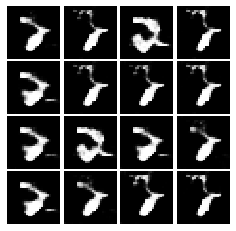

Epoch: 4, Iter: 1980, D: 0.2002, G:3.372


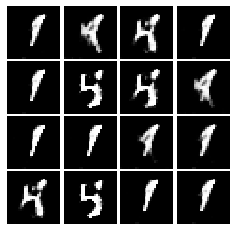

Epoch: 4, Iter: 2000, D: 0.5061, G:2.663


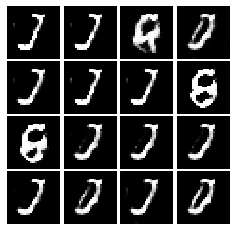

Epoch: 4, Iter: 2020, D: 0.1205, G:4.679


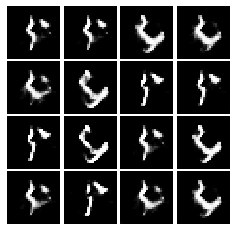

Epoch: 4, Iter: 2040, D: 0.3357, G:2.478


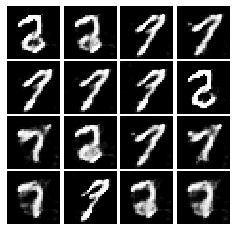

Epoch: 4, Iter: 2060, D: 0.489, G:3.915


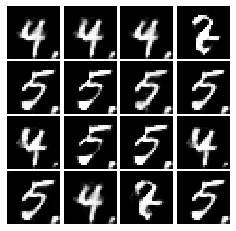

Epoch: 4, Iter: 2080, D: 0.4156, G:3.654


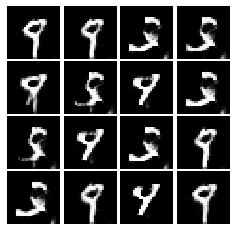

Epoch: 4, Iter: 2100, D: 0.2031, G:3.802


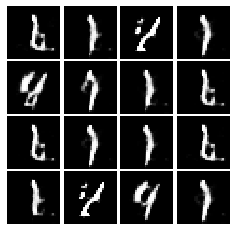

Epoch: 4, Iter: 2120, D: 0.2777, G:4.17


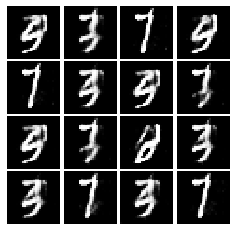

Epoch: 4, Iter: 2140, D: 0.4607, G:2.486


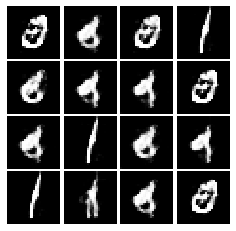

Epoch: 4, Iter: 2160, D: 0.3799, G:3.032


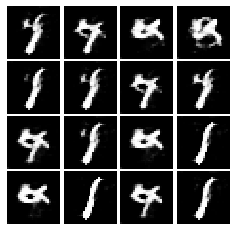

Epoch: 4, Iter: 2180, D: 0.242, G:5.02


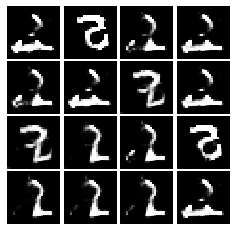

Epoch: 4, Iter: 2200, D: 0.1266, G:4.796


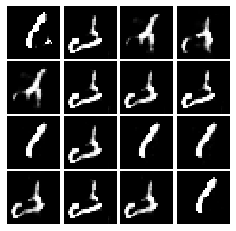

Epoch: 4, Iter: 2220, D: 0.2438, G:3.798


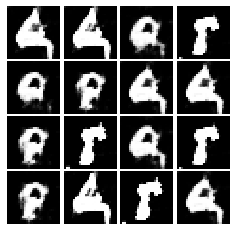

Epoch: 4, Iter: 2240, D: 0.3085, G:3.296


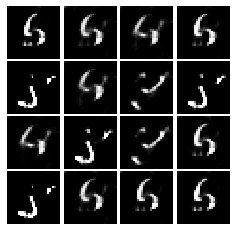

Epoch: 4, Iter: 2260, D: 0.2724, G:4.446


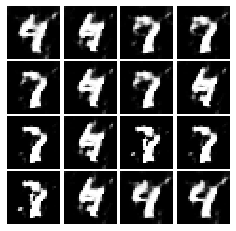

Epoch: 4, Iter: 2280, D: 0.1946, G:3.279


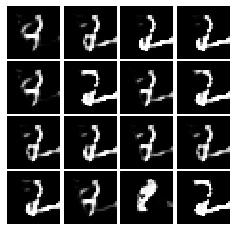

Epoch: 4, Iter: 2300, D: 0.7738, G:2.744


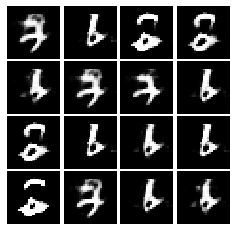

Epoch: 4, Iter: 2320, D: 0.3499, G:3.939


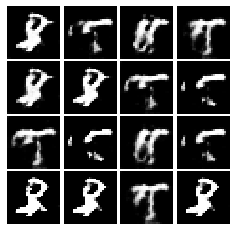

Epoch: 4, Iter: 2340, D: 0.4243, G:4.71


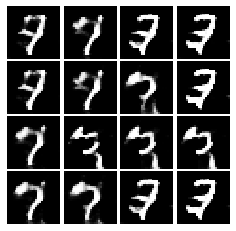

Final images


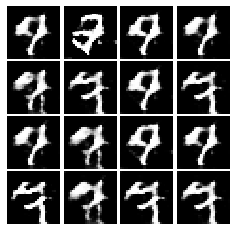

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
